<font color=darkblue>
    
# PART 1

<font color=darkblue>

# 1. Data: Import, clean and pre-process the data

In [153]:
# used to supress display of warnings
import warnings

# os is used to provide a way of using operating system dependent functionality
# We use it for setting working folder
import os

# Pandas is used for data manipulation and analysis
import pandas as pd 

# Numpy is used for large, multi-dimensional arrays and matrices, along with mathematical operators on these arrays
import numpy as np

# Matplotlib is a data visualization library for 2D plots of arrays, built on NumPy arrays 
# and designed to work with the broader SciPy stack
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pyplot

import scipy.stats as stats

# Seaborn is based on matplotlib, which aids in drawing attractive and informative statistical graphics.
import seaborn as sns


## Scikit-learn features various classification, regression and clustering algorithms
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn import metrics
from sklearn import preprocessing

# preprocessing
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import average_precision_score, confusion_matrix, accuracy_score, classification_report, plot_confusion_matrix

# suppress display of warnings
warnings.filterwarnings('ignore')

# display all dataframe columns
pd.options.display.max_columns = None

# to set the limit to 3 decimals
pd.options.display.float_format = '{:.7f}'.format

# display all dataframe rows
pd.options.display.max_rows = None


# Cross Validation related
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

#PCA
from sklearn.decomposition import PCA

In [154]:
vehicle_df = pd.read_csv("C:\\Users\\Sasikumar Bala\\JupyterWorkspace\\UnsupervisedLearning\\Assignment\\Project-2\\vehicle-1.csv")

In [155]:
vehicle_df.sample(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
548,94,39.0000000,75.0000000,184.0000000,72.0000000,8,155.0000000,42.0000000,19.0000000,133,175.0000000,365.0000000,145.0000000,70.0000000,4.0000000,5.0000000,192.0000000,200,bus
40,95,48.0000000,104.0000000,214.0000000,67.0000000,9,205.0000000,32.0000000,23.0000000,151,227.0000000,628.0000000,202.0000000,74.0000000,5.0000000,9.0000000,186.0000000,193,car
250,95,38.0000000,66.0000000,126.0000000,52.0000000,8,133.0000000,52.0000000,18.0000000,140,158.0000000,253.0000000,140.0000000,78.0000000,11.0000000,8.0000000,184.0000000,183,van
551,79,39.0000000,72.0000000,127.0000000,53.0000000,9,142.0000000,48.0000000,19.0000000,135,165.0000000,295.0000000,144.0000000,77.0000000,7.0000000,21.0000000,181.0000000,189,car
686,88,40.0000000,69.0000000,146.0000000,59.0000000,7,130.0000000,51.0000000,18.0000000,134,147.0000000,252.0000000,144.0000000,64.0000000,1.0000000,1.0000000,193.0000000,200,car
219,85,39.0000000,57.0000000,126.0000000,56.0000000,6,114.0000000,58.0000000,17.0000000,135,134.0000000,195.0000000,145.0000000,64.0000000,17.0000000,7.0000000,197.0000000,202,van
89,80,37.0000000,57.0000000,116.0000000,55.0000000,6,125.0000000,54.0000000,18.0000000,125,142.0000000,229.0000000,132.0000000,81.0000000,8.0000000,5.0000000,178.0000000,184,car
311,93,45.0000000,83.0000000,142.0000000,56.0000000,10,157.0000000,43.0000000,20.0000000,155,180.0000000,364.0000000,188.0000000,75.0000000,1.0000000,21.0000000,184.0000000,197,van
771,97,48.0000000,105.0000000,212.0000000,64.0000000,11,201.0000000,33.0000000,23.0000000,155,212.0000000,602.0000000,162.0000000,64.0000000,2.0000000,7.0000000,193.0000000,202,car
162,98,39.0000000,81.0000000,191.0000000,64.0000000,9,166.0000000,40.0000000,20.0000000,138,184.0000000,415.0000000,131.0000000,62.0000000,8.0000000,19.0000000,197.0000000,205,car


In [159]:
vehicle_df.shape
print('There are ',vehicle_df.shape[0], ' rows and ', vehicle_df.shape[1],' columns ')

There are  846  rows and  19  columns 


In [160]:
if(vehicle_df.isnull().any().sum()):
    print('There are null datapoints in the dataset')
else:
    print('There are no null datapoints in the dataset.')

There are null datapoints in the dataset


In [161]:
vehicle_df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [162]:
# checking the percentage of missing values in each variable

vehicle_df.isnull().sum()/len(vehicle_df)*100

compactness                   0.0000000
circularity                   0.5910165
distance_circularity          0.4728132
radius_ratio                  0.7092199
pr.axis_aspect_ratio          0.2364066
max.length_aspect_ratio       0.0000000
scatter_ratio                 0.1182033
elongatedness                 0.1182033
pr.axis_rectangularity        0.3546099
max.length_rectangularity     0.0000000
scaled_variance               0.3546099
scaled_variance.1             0.2364066
scaled_radius_of_gyration     0.2364066
scaled_radius_of_gyration.1   0.4728132
skewness_about                0.7092199
skewness_about.1              0.1182033
skewness_about.2              0.1182033
hollows_ratio                 0.0000000
class                         0.0000000
dtype: float64

In [163]:
vehicle_df.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [164]:
## Checking for any Negative numbers or special characters in the dataset as 

def hasBadDataPoints(vehicle_df):
    isBadData = False;
    isDigitColumn= False;
    
    for idx in vehicle_df.columns:
        if(vehicle_df[idx].dtype == 'int64'):
            for i in  range(1,len(vehicle_df[idx])):
                if(vehicle_df[idx][i].astype(str).isdigit() == False):
                    isBadData = True
                    print('Column Name',idx,' Row Id: ', i,' has a bad data point as -',vehicle_df[idx][i])

        if(vehicle_df[idx].dtype == 'float64'):
            for i in  range(1,len(vehicle_df[idx])):
                if(vehicle_df[idx][i].astype(str).replace('.','',1).isdigit() == False):
                    print('Column Name',idx,' Row Id: ', i,' has a bad data point as -',vehicle_df[idx][i])
                    isBadData = True
        
        if(vehicle_df[idx].dtype == 'object'):
            for i in range(1,len(vehicle_df[idx])):
                if(str(vehicle_df[idx][i]).isdigit() == True):
                    isDigitColumn =True
                    
                if(isDigitColumn and str(vehicle_df[idx][i]).isdigit() == False):
                    isBadData =True
                    print('Column -',idx,' Row Id: ', i,' has a bad data point as -',vehicle_df[idx][i])
            
        
        isDigitColumn =False
        
    return isBadData

In [165]:
if(hasBadDataPoints(vehicle_df)):
    print('Data set has above Bad or Negative Data points.Please correct them')
else:
    print('There are no Bad or negative Data Points')

Column Name circularity  Row Id:  5  has a bad data point as - nan
Column Name circularity  Row Id:  105  has a bad data point as - nan
Column Name circularity  Row Id:  118  has a bad data point as - nan
Column Name circularity  Row Id:  266  has a bad data point as - nan
Column Name circularity  Row Id:  396  has a bad data point as - nan
Column Name distance_circularity  Row Id:  35  has a bad data point as - nan
Column Name distance_circularity  Row Id:  118  has a bad data point as - nan
Column Name distance_circularity  Row Id:  207  has a bad data point as - nan
Column Name distance_circularity  Row Id:  319  has a bad data point as - nan
Column Name radius_ratio  Row Id:  9  has a bad data point as - nan
Column Name radius_ratio  Row Id:  78  has a bad data point as - nan
Column Name radius_ratio  Row Id:  159  has a bad data point as - nan
Column Name radius_ratio  Row Id:  287  has a bad data point as - nan
Column Name radius_ratio  Row Id:  345  has a bad data point as - nan

In [167]:
vehicle_df['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

In [168]:
## function to find outliers and quantile values, We will use it latter on EDA part.
# We will analyse each of the outliers and follow below strategy
# 1. High outliers if close to max value will be replaced with max value of the corresponding class
# 2. if high outlier is much above 75 Quantile value- we will drop that row from our analysis
# 3. Low outlier if close to min value will be replaced by min value of the corresponding class
# 4. low outlier if much lower than 25 quantile value will be dropped fromm analysis

def findOutlier(aSeries):
    
    q1 = aSeries.quantile(0.25)
    q3 = aSeries.quantile(0.75)
   
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    outliers_low = aSeries[(aSeries < fence_low)]
    outliers_high= aSeries[(aSeries > fence_high)]
    
    print ("25th Quantile value: ", q1)
    print('Outlier low Count =', outliers_low.count())
    print('List of Low outliers: \n')
    print(outliers_low)

    print ("75th Quantile value: ", q3)
    print('Outlier High Count = ', outliers_high.count())
    print('List of High outliers: \n')
    print(outliers_high)
    

<font color=darkblue>
    
# Observations:
   -You can see the number of null data points in each of the dimensions.
  
| Attribute Name | Number of null data points| % of missing Values in each Dimensions (*100) |
| --- | --- |  --- |
|compactness                    |0|  0.0000000 |
|circularity                    |5|  0.5910165 |
|distance_circularity           |4|  0.4728132 |
|radius_ratio                   |6|  0.7092199 |
|pr.axis_aspect_ratio           |2|  0.2364066 |
|max.length_aspect_ratio        |0|  0.0000000 |
|scatter_ratio                  |1|  0.1182033 |
|elongatedness                  |1|  0.1182033 |
|pr.axis_rectangularity         |3|  0.3546099 |
|max.length_rectangularity      |0|  0.0000000 |
|scaled_variance                |3|  0.3546099 |
|scaled_variance.1              |2|  0.2364066 |
|scaled_radius_of_gyration      |2|  0.2364066 |
|scaled_radius_of_gyration.1    |4|  0.4728132 |
|skewness_about                 |6|  0.7092199 |
|skewness_about.1               |1|  0.1182033 |
|skewness_about.2               |1|  0.1182033 |
|hollows_ratio                  |0|  0.0000000 |
|class                          |0|	 0.0000000 |

  - The missing values are below 1% from the original datasets volume, We will use median to replace the missing values.
  - From the data set we are clear there are only 3 types of vehicles

In [169]:
vehicle_df_Imputed = vehicle_df.copy(deep =True)
vehicle_df_Imputed

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0000000,83.0000000,178.0000000,72.0000000,10,162.0000000,42.0000000,20.0000000,159,176.0000000,379.0000000,184.0000000,70.0000000,6.0000000,16.0000000,187.0000000,197,van
1,91,41.0000000,84.0000000,141.0000000,57.0000000,9,149.0000000,45.0000000,19.0000000,143,170.0000000,330.0000000,158.0000000,72.0000000,9.0000000,14.0000000,189.0000000,199,van
2,104,50.0000000,106.0000000,209.0000000,66.0000000,10,207.0000000,32.0000000,23.0000000,158,223.0000000,635.0000000,220.0000000,73.0000000,14.0000000,9.0000000,188.0000000,196,car
3,93,41.0000000,82.0000000,159.0000000,63.0000000,9,144.0000000,46.0000000,19.0000000,143,160.0000000,309.0000000,127.0000000,63.0000000,6.0000000,10.0000000,199.0000000,207,van
4,85,44.0000000,70.0000000,205.0000000,103.0000000,52,149.0000000,45.0000000,19.0000000,144,241.0000000,325.0000000,188.0000000,127.0000000,9.0000000,11.0000000,180.0000000,183,bus
5,107,nan,106.0000000,172.0000000,50.0000000,6,255.0000000,26.0000000,28.0000000,169,280.0000000,957.0000000,264.0000000,85.0000000,5.0000000,9.0000000,181.0000000,183,bus
6,97,43.0000000,73.0000000,173.0000000,65.0000000,6,153.0000000,42.0000000,19.0000000,143,176.0000000,361.0000000,172.0000000,66.0000000,13.0000000,1.0000000,200.0000000,204,bus
7,90,43.0000000,66.0000000,157.0000000,65.0000000,9,137.0000000,48.0000000,18.0000000,146,162.0000000,281.0000000,164.0000000,67.0000000,3.0000000,3.0000000,193.0000000,202,van
8,86,34.0000000,62.0000000,140.0000000,61.0000000,7,122.0000000,54.0000000,17.0000000,127,141.0000000,223.0000000,112.0000000,64.0000000,2.0000000,14.0000000,200.0000000,208,van
9,93,44.0000000,98.0000000,nan,62.0000000,11,183.0000000,36.0000000,22.0000000,146,202.0000000,505.0000000,152.0000000,64.0000000,4.0000000,14.0000000,195.0000000,204,car


In [171]:
## Imputing with the Missing values with Median.

vehicle_df_Imputed = vehicle_df_Imputed.apply(lambda x : x.fillna(x.median(),axis=0) if x.dtype.kind in 'biufc' else x.fillna("NA"))

In [172]:
vehicle_df_Imputed.head(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0000000,83.0000000,178.0000000,72.0000000,10,162.0000000,42.0000000,20.0000000,159,176.0000000,379.0000000,184.0000000,70.0000000,6.0000000,16.0000000,187.0000000,197,van
1,91,41.0000000,84.0000000,141.0000000,57.0000000,9,149.0000000,45.0000000,19.0000000,143,170.0000000,330.0000000,158.0000000,72.0000000,9.0000000,14.0000000,189.0000000,199,van
2,104,50.0000000,106.0000000,209.0000000,66.0000000,10,207.0000000,32.0000000,23.0000000,158,223.0000000,635.0000000,220.0000000,73.0000000,14.0000000,9.0000000,188.0000000,196,car
3,93,41.0000000,82.0000000,159.0000000,63.0000000,9,144.0000000,46.0000000,19.0000000,143,160.0000000,309.0000000,127.0000000,63.0000000,6.0000000,10.0000000,199.0000000,207,van
4,85,44.0000000,70.0000000,205.0000000,103.0000000,52,149.0000000,45.0000000,19.0000000,144,241.0000000,325.0000000,188.0000000,127.0000000,9.0000000,11.0000000,180.0000000,183,bus
5,107,44.0000000,106.0000000,172.0000000,50.0000000,6,255.0000000,26.0000000,28.0000000,169,280.0000000,957.0000000,264.0000000,85.0000000,5.0000000,9.0000000,181.0000000,183,bus
6,97,43.0000000,73.0000000,173.0000000,65.0000000,6,153.0000000,42.0000000,19.0000000,143,176.0000000,361.0000000,172.0000000,66.0000000,13.0000000,1.0000000,200.0000000,204,bus
7,90,43.0000000,66.0000000,157.0000000,65.0000000,9,137.0000000,48.0000000,18.0000000,146,162.0000000,281.0000000,164.0000000,67.0000000,3.0000000,3.0000000,193.0000000,202,van
8,86,34.0000000,62.0000000,140.0000000,61.0000000,7,122.0000000,54.0000000,17.0000000,127,141.0000000,223.0000000,112.0000000,64.0000000,2.0000000,14.0000000,200.0000000,208,van
9,93,44.0000000,98.0000000,167.0000000,62.0000000,11,183.0000000,36.0000000,22.0000000,146,202.0000000,505.0000000,152.0000000,64.0000000,4.0000000,14.0000000,195.0000000,204,car


In [173]:
# checking the percentage of missing values in each variable after imputation with median

vehicle_df_Imputed.isnull().sum()/len(vehicle_df_Imputed)*100

compactness                   0.0000000
circularity                   0.0000000
distance_circularity          0.0000000
radius_ratio                  0.0000000
pr.axis_aspect_ratio          0.0000000
max.length_aspect_ratio       0.0000000
scatter_ratio                 0.0000000
elongatedness                 0.0000000
pr.axis_rectangularity        0.0000000
max.length_rectangularity     0.0000000
scaled_variance               0.0000000
scaled_variance.1             0.0000000
scaled_radius_of_gyration     0.0000000
scaled_radius_of_gyration.1   0.0000000
skewness_about                0.0000000
skewness_about.1              0.0000000
skewness_about.2              0.0000000
hollows_ratio                 0.0000000
class                         0.0000000
dtype: float64

<font color=darkblue>

#  2.EDA and visualisation

In [174]:
vehicle_df_Imputed.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0000000,93.6784870,8.2344743,73.0000000,87.0000000,93.0000000,100.0000000,119.0000000
circularity,846.0000000,44.8238771,6.1342725,33.0000000,40.0000000,44.0000000,49.0000000,59.0000000
distance_circularity,846.0000000,82.1004728,15.7415690,40.0000000,70.0000000,80.0000000,98.0000000,112.0000000
radius_ratio,846.0000000,168.8747045,33.4013556,104.0000000,141.0000000,167.0000000,195.0000000,333.0000000
pr.axis_aspect_ratio,846.0000000,61.6773050,7.8821876,47.0000000,57.0000000,61.0000000,65.0000000,138.0000000
max.length_aspect_ratio,846.0000000,8.5673759,4.6012167,2.0000000,7.0000000,8.0000000,10.0000000,55.0000000
scatter_ratio,846.0000000,168.8877069,33.1977103,112.0000000,147.0000000,157.0000000,198.0000000,265.0000000
elongatedness,846.0000000,40.9361702,7.8118824,26.0000000,33.0000000,43.0000000,46.0000000,61.0000000
pr.axis_rectangularity,846.0000000,20.5803783,2.5885580,17.0000000,19.0000000,20.0000000,23.0000000,29.0000000
max.length_rectangularity,846.0000000,147.9988180,14.5156516,118.0000000,137.0000000,146.0000000,159.0000000,188.0000000


In [175]:
# Prints the value below which 25% of the data lies

print("Data_quantile(25%):\n",vehicle_df_Imputed.quantile(q=0.25))

Data_quantile(25%):
 compactness                    87.0000000
circularity                    40.0000000
distance_circularity           70.0000000
radius_ratio                  141.0000000
pr.axis_aspect_ratio           57.0000000
max.length_aspect_ratio         7.0000000
scatter_ratio                 147.0000000
elongatedness                  33.0000000
pr.axis_rectangularity         19.0000000
max.length_rectangularity     137.0000000
scaled_variance               167.0000000
scaled_variance.1             318.2500000
scaled_radius_of_gyration     149.0000000
scaled_radius_of_gyration.1    67.0000000
skewness_about                  2.0000000
skewness_about.1                5.0000000
skewness_about.2              184.0000000
hollows_ratio                 190.2500000
Name: 0.25, dtype: float64


In [176]:
# Prints the value below which 50% of the data lies

print("Data_quantile(50%):\n",vehicle_df_Imputed.quantile(q=0.50))

Data_quantile(50%):
 compactness                    93.0000000
circularity                    44.0000000
distance_circularity           80.0000000
radius_ratio                  167.0000000
pr.axis_aspect_ratio           61.0000000
max.length_aspect_ratio         8.0000000
scatter_ratio                 157.0000000
elongatedness                  43.0000000
pr.axis_rectangularity         20.0000000
max.length_rectangularity     146.0000000
scaled_variance               179.0000000
scaled_variance.1             363.5000000
scaled_radius_of_gyration     173.5000000
scaled_radius_of_gyration.1    71.5000000
skewness_about                  6.0000000
skewness_about.1               11.0000000
skewness_about.2              188.0000000
hollows_ratio                 197.0000000
Name: 0.5, dtype: float64


In [177]:
# Prints the value below which 75% of the data lies

print("Data_quantile(75%):\n",vehicle_df_Imputed.quantile(q=0.75))

Data_quantile(75%):
 compactness                   100.0000000
circularity                    49.0000000
distance_circularity           98.0000000
radius_ratio                  195.0000000
pr.axis_aspect_ratio           65.0000000
max.length_aspect_ratio        10.0000000
scatter_ratio                 198.0000000
elongatedness                  46.0000000
pr.axis_rectangularity         23.0000000
max.length_rectangularity     159.0000000
scaled_variance               217.0000000
scaled_variance.1             586.7500000
scaled_radius_of_gyration     198.0000000
scaled_radius_of_gyration.1    75.0000000
skewness_about                  9.0000000
skewness_about.1               19.0000000
skewness_about.2              193.0000000
hollows_ratio                 201.0000000
Name: 0.75, dtype: float64


## Univariate Analysis
## Measure of skewness of  ‘Compactness’

In [178]:
compactness_mode =vehicle_df_Imputed['compactness'].mode()
compactness_median = vehicle_df_Imputed['compactness'].median()
compactness_mean = vehicle_df_Imputed['compactness'].mean()
print('Mode :',compactness_mode)
print('Median :',compactness_median)
print('Mean:',compactness_mean)
print ('Skewness on Compactness :',vehicle_df_Imputed.skew()['compactness'])

if(compactness_mean > compactness_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0    89
dtype: int64
Median : 93.0
Mean: 93.67848699763593
Skewness on Compactness : 0.38127063263996497
Then the distribution is positively skewed.


In [179]:
IQR_Compactness = vehicle_df_Imputed["compactness"].quantile(0.75) - vehicle_df_Imputed["compactness"].quantile(0.25)

print('IQR_Compactness -',IQR_Compactness)

high_Wiskers_outlier = vehicle_df_Imputed["compactness"].quantile(0.75) + 1.5*IQR_Compactness
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["compactness"].quantile(0.25)  - 1.5*IQR_Compactness
print('Lower outliers <',low_Wiskers_outlier)

IQR_Compactness - 13.0
Higher outliers > 119.5
Lower outliers < 67.5


Text(0.5, 1.0, 'Box Plot')

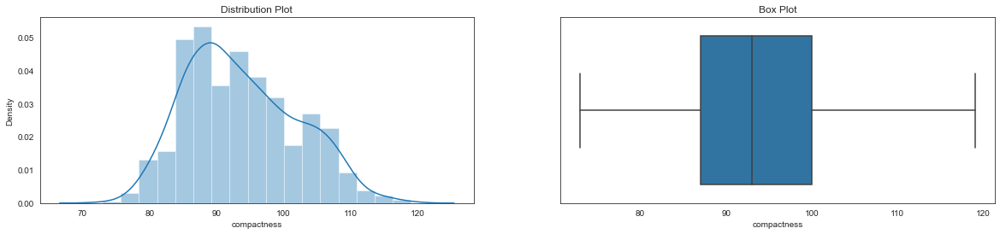

In [180]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['compactness'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['compactness'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - Compactness is positively distributed.
   - No outliers.

## Measure of skewness of  ‘circularity’

In [181]:
circularity_mode =vehicle_df_Imputed['circularity'].mode()
circularity_median = vehicle_df_Imputed['circularity'].median()
circularity_mean = vehicle_df_Imputed['circularity'].mean()
print('Mode :',circularity_mode)
print('Median :',circularity_median)
print('Mean:',circularity_mean)
print ('Skewness on circularity :',vehicle_df_Imputed.skew()['circularity'])

if(circularity_mean > circularity_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0   43.0000000
dtype: float64
Median : 44.0
Mean: 44.82387706855792
Skewness on circularity : 0.2649279874901165
Then the distribution is positively skewed.


In [182]:
IQR_circularity = vehicle_df_Imputed["circularity"].quantile(0.75) - vehicle_df_Imputed["circularity"].quantile(0.25)

print('IQR_circularity -',IQR_circularity)

high_Wiskers_outlier = vehicle_df_Imputed["circularity"].quantile(0.75) + 1.5*IQR_circularity
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["circularity"].quantile(0.25)  - 1.5*IQR_circularity
print('Lower outliers <',low_Wiskers_outlier)

IQR_circularity - 9.0
Higher outliers > 62.5
Lower outliers < 26.5


Text(0.5, 1.0, 'Box Plot')

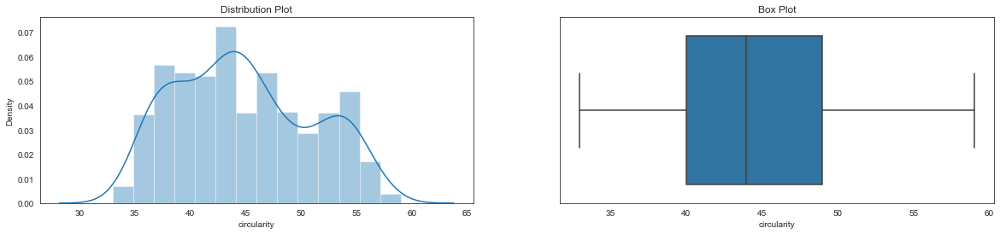

In [183]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['circularity'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['circularity'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - Circularity is positively distributed with multiple peaks.
   - No outliers.

## Measure of skewness of  ‘distance_circularity’

In [184]:
distance_circularity_mode =vehicle_df_Imputed['distance_circularity'].mode()
distance_circularity_median = vehicle_df_Imputed['distance_circularity'].median()
distance_circularity_mean = vehicle_df_Imputed['distance_circularity'].mean()
print('Mode :',distance_circularity_mode)
print('Median :',distance_circularity_median)
print('Mean:',distance_circularity_mean)
print ('Skewness on distance_circularity :',vehicle_df_Imputed.skew()['distance_circularity'])

if(distance_circularity_mean > distance_circularity_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0   66.0000000
dtype: float64
Median : 80.0
Mean: 82.10047281323877
Skewness on distance_circularity : 0.10871801180935975
Then the distribution is positively skewed.


In [185]:
IQR_distance_circularity  = vehicle_df_Imputed["distance_circularity"].quantile(0.75) - vehicle_df_Imputed["distance_circularity"].quantile(0.25)

print('IQR_distance_circularity -',IQR_distance_circularity)

high_Wiskers_outlier = vehicle_df_Imputed["distance_circularity"].quantile(0.75) + 1.5*IQR_distance_circularity
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["distance_circularity"].quantile(0.25)  - 1.5*IQR_distance_circularity
print('Lower outliers <',low_Wiskers_outlier)

IQR_distance_circularity - 28.0
Higher outliers > 140.0
Lower outliers < 28.0


Text(0.5, 1.0, 'Box Plot')

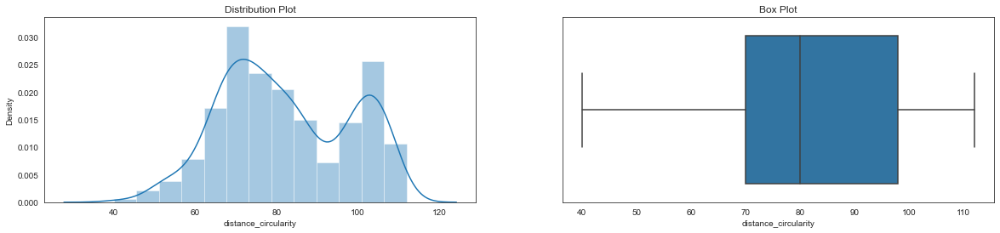

In [186]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['distance_circularity'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['distance_circularity'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - distance_circularity is positively distributed with multi modal.
   - No outliers.

## Measure of skewness of  ‘radius_ratio’

In [187]:
radius_ratio_mode =vehicle_df_Imputed['radius_ratio'].mode()
radius_ratio_median = vehicle_df_Imputed['radius_ratio'].median()
radius_ratio_mean = vehicle_df_Imputed['radius_ratio'].mean()
print('Mode :',radius_ratio_mode)
print('Median :',radius_ratio_median)
print('Mean:',radius_ratio_mean)
print ('Skewness on radius_ratio :',vehicle_df_Imputed.skew()['radius_ratio'])

if(radius_ratio_mean > radius_ratio_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0   197.0000000
dtype: float64
Median : 167.0
Mean: 168.87470449172577
Skewness on radius_ratio : 0.3975716412698015
Then the distribution is positively skewed.


In [188]:
IQR_radius_ratio  = vehicle_df_Imputed["radius_ratio"].quantile(0.75) - vehicle_df_Imputed["radius_ratio"].quantile(0.25)

print('IQR_radius_ratio -',IQR_radius_ratio)

high_Wiskers_outlier = vehicle_df_Imputed["radius_ratio"].quantile(0.75) + 1.5*IQR_radius_ratio
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["radius_ratio"].quantile(0.25)  - 1.5*IQR_radius_ratio
print('Lower outliers <',low_Wiskers_outlier)

IQR_radius_ratio - 54.0
Higher outliers > 276.0
Lower outliers < 60.0


Text(0.5, 1.0, 'Box Plot')

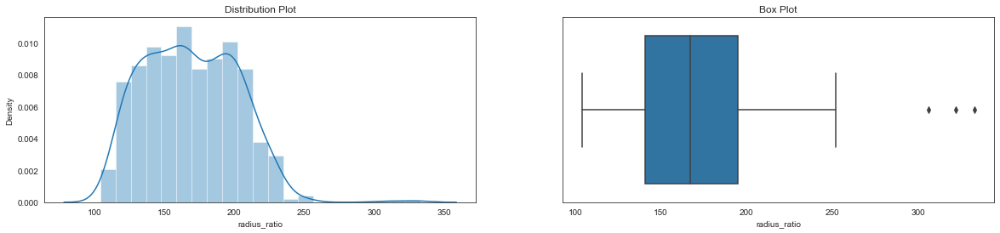

In [189]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['radius_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['radius_ratio'],ax=ax2)
ax2.set_title("Box Plot")

In [190]:
# Since we have Outlliers lets do the Outlier treatment

findOutlier(vehicle_df_Imputed['radius_ratio'])

25th Quantile value:  141.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: radius_ratio, dtype: float64)
75th Quantile value:  195.0
Outlier High Count =  3
List of High outliers: 

37    306.0000000
135   322.0000000
388   333.0000000
Name: radius_ratio, dtype: float64


In [191]:
# Lets observe full rows for these outliers

vehicle_df_Imputed.loc[[37,135,388]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
37,90,48.0000000,86.0000000,306.0000000,126.0000000,49,153.0000000,44.0000000,19.0000000,156,272.0000000,346.0000000,200.0000000,118.0000000,0.0000000,15.0000000,185.0000000,194,van
135,89,47.0000000,83.0000000,322.0000000,133.0000000,48,158.0000000,43.0000000,20.0000000,163,229.0000000,364.0000000,176.0000000,97.0000000,0.0000000,14.0000000,184.0000000,194,van
388,94,47.0000000,85.0000000,333.0000000,138.0000000,49,155.0000000,43.0000000,19.0000000,155,320.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van


In [192]:
# All these are for class van. Lets observe maximum radius_ratio for class van

vehicle_df_Imputed[vehicle_df_Imputed['class']== "van"]['radius_ratio'].sort_values( ascending=False).head(8)

388   333.0000000
135   322.0000000
37    306.0000000
706   250.0000000
291   246.0000000
523   231.0000000
0     178.0000000
535   176.0000000
Name: radius_ratio, dtype: float64

In [193]:
# We can see the largest value other than outlier row is 250
# values of radius ratio for outlier are far away  from the max value 250. Lets replace these values with 250

vehicle_df_Imputed.loc[[37,135,388],'radius_ratio']=250.0

In [194]:
# Double checking

vehicle_df_Imputed.loc[[37,135,388]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
37,90,48.0000000,86.0000000,250.0000000,126.0000000,49,153.0000000,44.0000000,19.0000000,156,272.0000000,346.0000000,200.0000000,118.0000000,0.0000000,15.0000000,185.0000000,194,van
135,89,47.0000000,83.0000000,250.0000000,133.0000000,48,158.0000000,43.0000000,20.0000000,163,229.0000000,364.0000000,176.0000000,97.0000000,0.0000000,14.0000000,184.0000000,194,van
388,94,47.0000000,85.0000000,250.0000000,138.0000000,49,155.0000000,43.0000000,19.0000000,155,320.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van


<font color=darkblue>
    
# Observations:
   - radius_ratio is positively distributed with multi modal.
   - There are few outliers.
   - There are 3 values with High outliers.
   - All the 3 rows belongs to vehicle type - Van
   - All the 3 outliers are replaced with the 250 which is the maximum value other than outliers.

## Measure of skewness of  ‘pr.axis_aspect_ratio’

In [195]:
pr_axis_aspect_ratio_mode =vehicle_df_Imputed['pr.axis_aspect_ratio'].mode()
pr_axis_aspect_ratio_median = vehicle_df_Imputed['pr.axis_aspect_ratio'].median()
pr_axis_aspect_ratio_mean = vehicle_df_Imputed['pr.axis_aspect_ratio'].mean()
print('Mode :',pr_axis_aspect_ratio_mode)
print('Median :',pr_axis_aspect_ratio_median)
print('Mean:',pr_axis_aspect_ratio_mean)
print ('Skewness on pr.axis_aspect_ratio :',vehicle_df_Imputed.skew()['pr.axis_aspect_ratio'])

if(pr_axis_aspect_ratio_mean > pr_axis_aspect_ratio_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   64.0000000
dtype: float64
Median : 61.0
Mean: 61.677304964539005
Skewness on pr.axis_aspect_ratio : 3.8353916077858434
Then the distribution is positively skewed.


In [196]:
IQR_pr_axis_aspect_ratio  = vehicle_df_Imputed["pr.axis_aspect_ratio"].quantile(0.75) - vehicle_df_Imputed["pr.axis_aspect_ratio"].quantile(0.25)

print('IQR_pr_axis_aspect_ratio -',IQR_pr_axis_aspect_ratio)

high_Wiskers_outlier = vehicle_df_Imputed["pr.axis_aspect_ratio"].quantile(0.75) + 1.5*IQR_pr_axis_aspect_ratio
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["pr.axis_aspect_ratio"].quantile(0.25)  - 1.5*IQR_pr_axis_aspect_ratio
print('Lower outliers <',low_Wiskers_outlier)

IQR_pr_axis_aspect_ratio - 8.0
Higher outliers > 77.0
Lower outliers < 45.0


Text(0.5, 1.0, 'Box Plot')

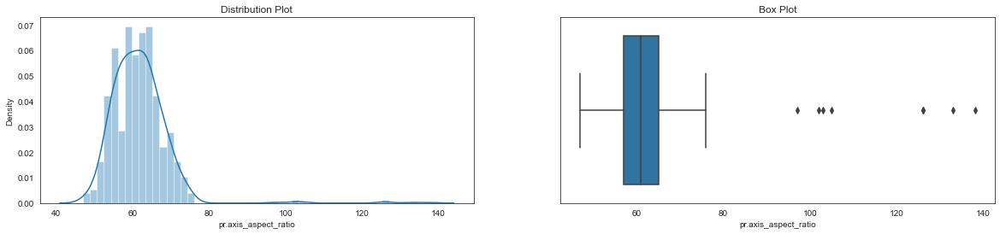

In [197]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['pr.axis_aspect_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['pr.axis_aspect_ratio'],ax=ax2)
ax2.set_title("Box Plot")

In [198]:
# Since we have Outlliers lets do the Outlier treatment

findOutlier(vehicle_df_Imputed['pr.axis_aspect_ratio'])

25th Quantile value:  57.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: pr.axis_aspect_ratio, dtype: float64)
75th Quantile value:  65.0
Outlier High Count =  8
List of High outliers: 

4     103.0000000
37    126.0000000
100   126.0000000
135   133.0000000
291   102.0000000
388   138.0000000
523    97.0000000
706   105.0000000
Name: pr.axis_aspect_ratio, dtype: float64


In [199]:
vehicle_df_Imputed.loc[[4,37,100,135,291,388,523,706]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
4,85,44.0000000,70.0000000,205.0000000,103.0000000,52,149.0000000,45.0000000,19.0000000,144,241.0000000,325.0000000,188.0000000,127.0000000,9.0000000,11.0000000,180.0000000,183,bus
37,90,48.0000000,86.0000000,250.0000000,126.0000000,49,153.0000000,44.0000000,19.0000000,156,272.0000000,346.0000000,200.0000000,118.0000000,0.0000000,15.0000000,185.0000000,194,van
100,82,45.0000000,66.0000000,252.0000000,126.0000000,52,148.0000000,45.0000000,19.0000000,144,237.0000000,326.0000000,185.0000000,119.0000000,1.0000000,1.0000000,181.0000000,185,bus
135,89,47.0000000,83.0000000,250.0000000,133.0000000,48,158.0000000,43.0000000,20.0000000,163,229.0000000,364.0000000,176.0000000,97.0000000,0.0000000,14.0000000,184.0000000,194,van
291,89,45.0000000,81.0000000,246.0000000,102.0000000,43,155.0000000,44.0000000,20.0000000,160,200.0000000,347.0000000,177.0000000,90.0000000,9.0000000,17.0000000,183.0000000,192,van
388,94,47.0000000,85.0000000,250.0000000,138.0000000,49,155.0000000,43.0000000,19.0000000,155,320.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van
523,90,43.0000000,81.0000000,231.0000000,97.0000000,46,150.0000000,45.0000000,19.0000000,149,200.0000000,332.0000000,164.0000000,91.0000000,5.0000000,9.0000000,186.0000000,196,van
706,82,43.0000000,70.0000000,250.0000000,105.0000000,55,139.0000000,48.0000000,18.0000000,145,231.0000000,289.0000000,172.0000000,99.0000000,4.0000000,9.0000000,190.0000000,199,van


In [171]:
# Index 4 and 100 belongs to class Bus while others belong to class van. Lets observe max values of this column for
#both bus and van

In [200]:
vehicle_df_Imputed[vehicle_df_Imputed['class'] =='bus']['pr.axis_aspect_ratio'].sort_values(ascending =False).head(8)

100   126.0000000
4     103.0000000
84     76.0000000
556    75.0000000
450    75.0000000
641    75.0000000
88     75.0000000
275    75.0000000
Name: pr.axis_aspect_ratio, dtype: float64

In [201]:
# We can see the largest value other than outlier row is 76
# values of pr.axis_aspect_ratio for outlier are far away  from the max value 76. Lets replace these values with 76

vehicle_df_Imputed.loc[[4,100],'pr.axis_aspect_ratio']=76

In [202]:
## Double Check
vehicle_df_Imputed.loc[[4,100]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
4,85,44.0000000,70.0000000,205.0000000,76.0000000,52,149.0000000,45.0000000,19.0000000,144,241.0000000,325.0000000,188.0000000,127.0000000,9.0000000,11.0000000,180.0000000,183,bus
100,82,45.0000000,66.0000000,252.0000000,76.0000000,52,148.0000000,45.0000000,19.0000000,144,237.0000000,326.0000000,185.0000000,119.0000000,1.0000000,1.0000000,181.0000000,185,bus


In [203]:
vehicle_df_Imputed[vehicle_df_Imputed['class'] =='van']['pr.axis_aspect_ratio'].sort_values(ascending =False).head(8)

388   138.0000000
135   133.0000000
37    126.0000000
706   105.0000000
291   102.0000000
523    97.0000000
0      72.0000000
668    70.0000000
Name: pr.axis_aspect_ratio, dtype: float64

In [204]:
# We can see the largest value other than outlier row is 72
# values of pr.axis_aspect_ratio for outlier are far away  from the max value 72. Lets replace these values with 72

vehicle_df_Imputed.loc[[388,135,37,706,291,523],'pr.axis_aspect_ratio']=72

In [205]:
## Double Check the outlier rows.
vehicle_df_Imputed.loc[[388,135,37,706,291,523]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
388,94,47.0000000,85.0000000,250.0000000,72.0000000,49,155.0000000,43.0000000,19.0000000,155,320.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van
135,89,47.0000000,83.0000000,250.0000000,72.0000000,48,158.0000000,43.0000000,20.0000000,163,229.0000000,364.0000000,176.0000000,97.0000000,0.0000000,14.0000000,184.0000000,194,van
37,90,48.0000000,86.0000000,250.0000000,72.0000000,49,153.0000000,44.0000000,19.0000000,156,272.0000000,346.0000000,200.0000000,118.0000000,0.0000000,15.0000000,185.0000000,194,van
706,82,43.0000000,70.0000000,250.0000000,72.0000000,55,139.0000000,48.0000000,18.0000000,145,231.0000000,289.0000000,172.0000000,99.0000000,4.0000000,9.0000000,190.0000000,199,van
291,89,45.0000000,81.0000000,246.0000000,72.0000000,43,155.0000000,44.0000000,20.0000000,160,200.0000000,347.0000000,177.0000000,90.0000000,9.0000000,17.0000000,183.0000000,192,van
523,90,43.0000000,81.0000000,231.0000000,72.0000000,46,150.0000000,45.0000000,19.0000000,149,200.0000000,332.0000000,164.0000000,91.0000000,5.0000000,9.0000000,186.0000000,196,van


<font color=darkblue>
    
# Observations:
   - pr.axis_aspect_ratio is positively distributed.
   - There are few outliers.
   - There are 8 values more than High outliers.
   - 6 rows belongs to vehicle type - Van and 2 rows belongs to bus.
   - All the 6 outliers of vehicle type Van has been replaced with the 72 and the 2 outliers od type bus has been replaced with 76.

## Measure of skewness of  ‘max.length_aspect_ratio’

In [206]:
length_aspect_ratio_mode =vehicle_df_Imputed['max.length_aspect_ratio'].mode()
length_aspect_ratio_median = vehicle_df_Imputed['max.length_aspect_ratio'].median()
length_aspect_ratio_mean = vehicle_df_Imputed['max.length_aspect_ratio'].mean()
print('Mode :',length_aspect_ratio_mode)
print('Median :',length_aspect_ratio_median)
print('Mean:',length_aspect_ratio_mean)
print ('Skewness on max.length_aspect_ratio :',vehicle_df_Imputed.skew()['max.length_aspect_ratio'])

if(length_aspect_ratio_mean > length_aspect_ratio_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0    7
dtype: int64
Median : 8.0
Mean: 8.567375886524824
Skewness on max.length_aspect_ratio : 6.7783936191089476
Then the distribution is positively skewed.


In [207]:
IQR_max_length_aspect_ratio  = vehicle_df_Imputed["max.length_aspect_ratio"].quantile(0.75) - vehicle_df_Imputed["max.length_aspect_ratio"].quantile(0.25)

print('IQR_max_length_aspect_ratio -',IQR_max_length_aspect_ratio)

high_Wiskers_outlier = vehicle_df_Imputed["max.length_aspect_ratio"].quantile(0.75) + 1.5*IQR_max_length_aspect_ratio
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["max.length_aspect_ratio"].quantile(0.25)  - 1.5*IQR_max_length_aspect_ratio
print('Lower outliers <',low_Wiskers_outlier)

IQR_max_length_aspect_ratio - 3.0
Higher outliers > 14.5
Lower outliers < 2.5


Text(0.5, 1.0, 'Box Plot')

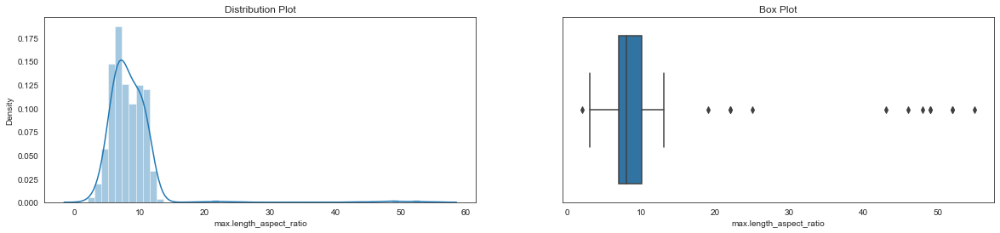

In [208]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['max.length_aspect_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['max.length_aspect_ratio'],ax=ax2)
ax2.set_title("Box Plot")

In [209]:
findOutlier(vehicle_df_Imputed['max.length_aspect_ratio'])

25th Quantile value:  7.0
Outlier low Count = 1
List of Low outliers: 

655    2
Name: max.length_aspect_ratio, dtype: int64
75th Quantile value:  10.0
Outlier High Count =  12
List of High outliers: 

4      52
37     49
100    52
127    22
135    48
291    43
388    49
391    25
523    46
544    19
706    55
815    22
Name: max.length_aspect_ratio, dtype: int64


In [210]:
# Lets observe full rows for these outliers
vehicle_df_Imputed.loc[[655,4,37,100,127,135,291,388,391,523,544,706,815]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
655,86,35.0000000,44.0000000,110.0000000,54.0000000,2,119.0000000,57.0000000,17.0000000,121,139.0000000,208.0000000,137.0000000,90.0000000,6.0000000,1.0000000,180.0000000,183,van
4,85,44.0000000,70.0000000,205.0000000,76.0000000,52,149.0000000,45.0000000,19.0000000,144,241.0000000,325.0000000,188.0000000,127.0000000,9.0000000,11.0000000,180.0000000,183,bus
37,90,48.0000000,86.0000000,250.0000000,72.0000000,49,153.0000000,44.0000000,19.0000000,156,272.0000000,346.0000000,200.0000000,118.0000000,0.0000000,15.0000000,185.0000000,194,van
100,82,45.0000000,66.0000000,252.0000000,76.0000000,52,148.0000000,45.0000000,19.0000000,144,237.0000000,326.0000000,185.0000000,119.0000000,1.0000000,1.0000000,181.0000000,185,bus
127,85,41.0000000,66.0000000,155.0000000,65.0000000,22,149.0000000,45.0000000,19.0000000,139,173.0000000,330.0000000,155.0000000,75.0000000,6.0000000,16.0000000,184.0000000,191,bus
135,89,47.0000000,83.0000000,250.0000000,72.0000000,48,158.0000000,43.0000000,20.0000000,163,229.0000000,364.0000000,176.0000000,97.0000000,0.0000000,14.0000000,184.0000000,194,van
291,89,45.0000000,81.0000000,246.0000000,72.0000000,43,155.0000000,44.0000000,20.0000000,160,200.0000000,347.0000000,177.0000000,90.0000000,9.0000000,17.0000000,183.0000000,192,van
388,94,47.0000000,85.0000000,250.0000000,72.0000000,49,155.0000000,43.0000000,19.0000000,155,320.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van
391,91,38.0000000,70.0000000,160.0000000,66.0000000,25,140.0000000,47.0000000,18.0000000,139,162.0000000,296.0000000,130.0000000,67.0000000,4.0000000,11.0000000,192.0000000,202,van
523,90,43.0000000,81.0000000,231.0000000,72.0000000,46,150.0000000,45.0000000,19.0000000,149,200.0000000,332.0000000,164.0000000,91.0000000,5.0000000,9.0000000,186.0000000,196,van


In [211]:
# Lower Outlier row is of Vehicle type -Van.
# Index 4 ,100, 127, 544, 815 are vehicle type - bus and other index belongs to Van type.

In [212]:
vehicle_df_Imputed[vehicle_df_Imputed['class'] =='van']['max.length_aspect_ratio'].sort_values(ascending =False).head(20)

706    55
388    49
37     49
135    48
523    46
291    43
391    25
254    12
545    12
668    12
477    11
693    11
235    11
252    11
508    11
484    11
682    11
611    11
680    11
657    11
Name: max.length_aspect_ratio, dtype: int64

In [213]:
# We can see the largest value other than outlier row is 12
# values of max.length_aspect_ratio for outlier are far away  from the max value 12. Lets replace these values with 12

vehicle_df_Imputed.loc[[37,135,291,388,391,523,706],'max.length_aspect_ratio']=12

In [214]:
## Double Check
vehicle_df_Imputed.loc[[37,135,291,388,391,523,706]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
37,90,48.0000000,86.0000000,250.0000000,72.0000000,12,153.0000000,44.0000000,19.0000000,156,272.0000000,346.0000000,200.0000000,118.0000000,0.0000000,15.0000000,185.0000000,194,van
135,89,47.0000000,83.0000000,250.0000000,72.0000000,12,158.0000000,43.0000000,20.0000000,163,229.0000000,364.0000000,176.0000000,97.0000000,0.0000000,14.0000000,184.0000000,194,van
291,89,45.0000000,81.0000000,246.0000000,72.0000000,12,155.0000000,44.0000000,20.0000000,160,200.0000000,347.0000000,177.0000000,90.0000000,9.0000000,17.0000000,183.0000000,192,van
388,94,47.0000000,85.0000000,250.0000000,72.0000000,12,155.0000000,43.0000000,19.0000000,155,320.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van
391,91,38.0000000,70.0000000,160.0000000,66.0000000,12,140.0000000,47.0000000,18.0000000,139,162.0000000,296.0000000,130.0000000,67.0000000,4.0000000,11.0000000,192.0000000,202,van
523,90,43.0000000,81.0000000,231.0000000,72.0000000,12,150.0000000,45.0000000,19.0000000,149,200.0000000,332.0000000,164.0000000,91.0000000,5.0000000,9.0000000,186.0000000,196,van
706,82,43.0000000,70.0000000,250.0000000,72.0000000,12,139.0000000,48.0000000,18.0000000,145,231.0000000,289.0000000,172.0000000,99.0000000,4.0000000,9.0000000,190.0000000,199,van


In [187]:
vehicle_df_Imputed[vehicle_df_Imputed['class'] =='bus']['max.length_aspect_ratio'].sort_values(ascending =False).head(8)

4      52
100    52
815    22
127    22
544    19
108     8
118     8
592     8
Name: max.length_aspect_ratio, dtype: int64

In [215]:
# We can see the largest value other than outlier row is 8
# values of max.length_aspect_ratio for outlier are far away  from the max value 8. Lets replace these values with 8

vehicle_df_Imputed.loc[[4,100,127,544,815],'max.length_aspect_ratio']=8

In [216]:
vehicle_df_Imputed.loc[[4,100,127,544,815]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
4,85,44.0000000,70.0000000,205.0000000,76.0000000,8,149.0000000,45.0000000,19.0000000,144,241.0000000,325.0000000,188.0000000,127.0000000,9.0000000,11.0000000,180.0000000,183,bus
100,82,45.0000000,66.0000000,252.0000000,76.0000000,8,148.0000000,45.0000000,19.0000000,144,237.0000000,326.0000000,185.0000000,119.0000000,1.0000000,1.0000000,181.0000000,185,bus
127,85,41.0000000,66.0000000,155.0000000,65.0000000,8,149.0000000,45.0000000,19.0000000,139,173.0000000,330.0000000,155.0000000,75.0000000,6.0000000,16.0000000,184.0000000,191,bus
544,88,43.0000000,70.0000000,177.0000000,74.0000000,8,152.0000000,44.0000000,19.0000000,143,180.0000000,342.0000000,168.0000000,76.0000000,1.0000000,9.0000000,186.0000000,189,bus
815,81,45.0000000,68.0000000,154.0000000,69.0000000,8,151.0000000,45.0000000,19.0000000,147,186.0000000,335.0000000,186.0000000,88.0000000,1.0000000,10.0000000,180.0000000,185,bus


In [217]:
## Treating Lower outlier

vehicle_df_Imputed[vehicle_df_Imputed['class'] =='van']['max.length_aspect_ratio'].sort_values(ascending =True).head(8)

655    2
230    3
498    3
550    4
374    4
845    5
755    5
41     5
Name: max.length_aspect_ratio, dtype: int64

In [218]:
# We can see the next large value other than lower outlier limit is 3
# values of max.length_aspect_ratio for lower outlier can be replace with 3

vehicle_df_Imputed.loc[[655],'max.length_aspect_ratio']=3

In [219]:
## Doubke Checking
vehicle_df_Imputed.loc[[655]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
655,86,35.0000000,44.0000000,110.0000000,54.0000000,3,119.0000000,57.0000000,17.0000000,121,139.0000000,208.0000000,137.0000000,90.0000000,6.0000000,1.0000000,180.0000000,183,van


<font color=darkblue>
    
# Observations:
   - max.length_aspect_ratio is positively distributed.
   - There are few Higher outliers and only one lower outlier.

## Measure of skewness of  ‘scatter_ratio’

In [220]:
scatter_ratio_mode =vehicle_df_Imputed['scatter_ratio'].mode()
scatter_ratio_median = vehicle_df_Imputed['scatter_ratio'].median()
scatter_ratio_mean = vehicle_df_Imputed['scatter_ratio'].mean()
print('Mode :',scatter_ratio_mode)
print('Median :',scatter_ratio_median)
print('Mean:',scatter_ratio_mean)
print ('Skewness on scatter_ratio :',vehicle_df_Imputed.skew()['scatter_ratio'])

if(scatter_ratio_mean > scatter_ratio_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   150.0000000
dtype: float64
Median : 157.0
Mean: 168.88770685579198
Skewness on scatter_ratio : 0.6087097328672928
Then the distribution is positively skewed.


In [221]:
IQR_scatter_ratio  = vehicle_df_Imputed["scatter_ratio"].quantile(0.75) - vehicle_df_Imputed["scatter_ratio"].quantile(0.25)

print('IQR_scatter_ratio -',IQR_scatter_ratio)

high_Wiskers_outlier = vehicle_df_Imputed["scatter_ratio"].quantile(0.75) + 1.5*IQR_scatter_ratio
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["scatter_ratio"].quantile(0.25)  - 1.5*IQR_scatter_ratio
print('Lower outliers <',low_Wiskers_outlier)

IQR_scatter_ratio - 51.0
Higher outliers > 274.5
Lower outliers < 70.5


Text(0.5, 1.0, 'Box Plot')

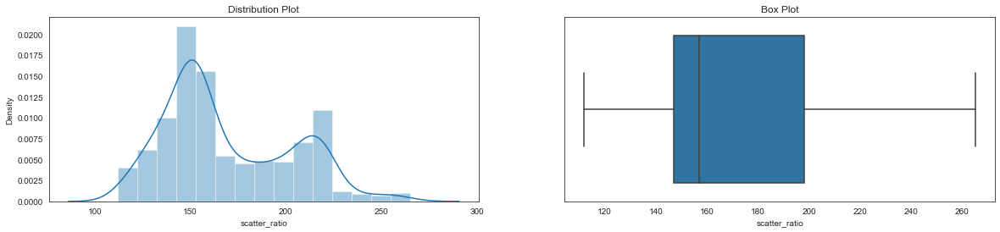

In [222]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['scatter_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['scatter_ratio'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - scatter_ratio is positively distributed and Bimodal.
   - There are no outliers.

## Measure of skewness of  ‘elongatedness’

In [223]:
elongatedness_mode =vehicle_df_Imputed['elongatedness'].mode()
elongatedness_median = vehicle_df_Imputed['elongatedness'].median()
elongatedness_mean = vehicle_df_Imputed['elongatedness'].mean()
print('Mode :',elongatedness_mode)
print('Median :',elongatedness_median)
print('Mean:',elongatedness_mean)
print ('Skewness on elongatedness_mean :',vehicle_df_Imputed.skew()['elongatedness'])

if(elongatedness_mean > elongatedness_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   31.0000000
1   45.0000000
dtype: float64
Median : 43.0
Mean: 40.93617021276596
Skewness on elongatedness_mean : 0.046951051315584164
Then the distribution is negatively skewed.


In [224]:
IQR_elongatedness = vehicle_df_Imputed["elongatedness"].quantile(0.75) - vehicle_df_Imputed["elongatedness"].quantile(0.25)

print('IQR_elongatedness -',IQR_elongatedness)

high_Wiskers_outlier = vehicle_df_Imputed["elongatedness"].quantile(0.75) + 1.5*IQR_elongatedness
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["elongatedness"].quantile(0.25)  - 1.5*IQR_elongatedness
print('Lower outliers <',low_Wiskers_outlier)

IQR_elongatedness - 13.0
Higher outliers > 65.5
Lower outliers < 13.5


Text(0.5, 1.0, 'Box Plot')

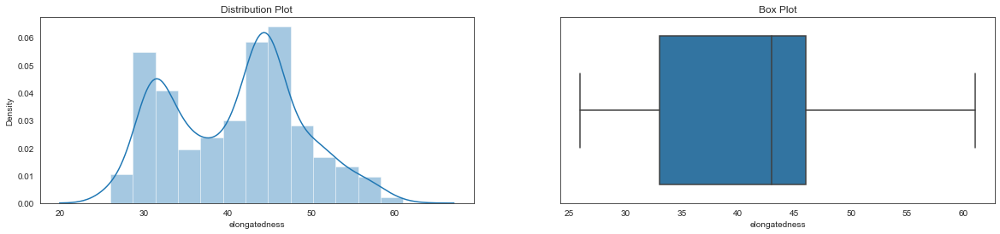

In [225]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['elongatedness'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['elongatedness'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - Elongatedness is negatively distributed and Bimodal.
   - There are no outliers.

## Measure of skewness of  ‘pr.axis_rectangularity’

In [226]:
pr_axis_rectangularity_mode =vehicle_df_Imputed['pr.axis_rectangularity'].mode()
pr_axis_rectangularity_median = vehicle_df_Imputed['pr.axis_rectangularity'].median()
pr_axis_rectangularity_mean = vehicle_df_Imputed['pr.axis_rectangularity'].mean()
print('Mode :',pr_axis_rectangularity_mode)
print('Median :',pr_axis_rectangularity_median)
print('Mean:',pr_axis_rectangularity_mean)
print ('Skewness on elongatedness_mean :',vehicle_df_Imputed.skew()['pr.axis_rectangularity'])

if(pr_axis_rectangularity_mean > pr_axis_rectangularity_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   19.0000000
dtype: float64
Median : 20.0
Mean: 20.580378250591018
Skewness on elongatedness_mean : 0.7744056757899445
Then the distribution is positively skewed.


In [227]:
IQR_pr_axis_rectangularity = vehicle_df_Imputed["pr.axis_rectangularity"].quantile(0.75) - vehicle_df_Imputed["pr.axis_rectangularity"].quantile(0.25)

print('IQR_pr_axis_rectangularity -',IQR_pr_axis_rectangularity)

high_Wiskers_outlier = vehicle_df_Imputed["pr.axis_rectangularity"].quantile(0.75) + 1.5*IQR_pr_axis_rectangularity
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["pr.axis_rectangularity"].quantile(0.25)  - 1.5*IQR_pr_axis_rectangularity
print('Lower outliers <',low_Wiskers_outlier)

IQR_pr_axis_rectangularity - 4.0
Higher outliers > 29.0
Lower outliers < 13.0


Text(0.5, 1.0, 'Box Plot')

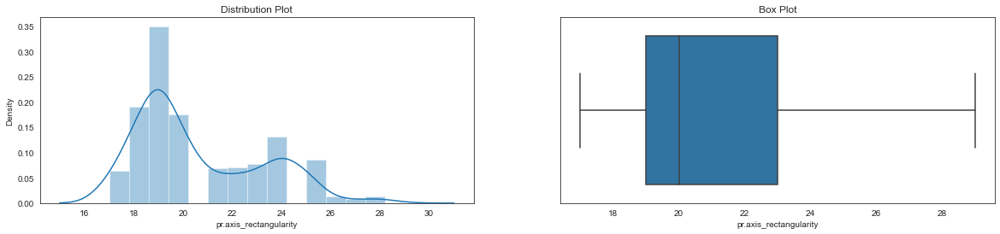

In [228]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['pr.axis_rectangularity'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['pr.axis_rectangularity'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - pr.axis_rectangularity is Positively distributed and Bimodal.
   - There are no outliers.

## Measure of skewness of  ‘scaled_variance’

In [229]:
scaled_variance_mode =vehicle_df_Imputed['scaled_variance'].mode()
scaled_variance_median = vehicle_df_Imputed['scaled_variance'].median()
scaled_variance_mean = vehicle_df_Imputed['scaled_variance'].mean()
print('Mode :',scaled_variance_mode)
print('Median :',scaled_variance_median)
print('Mean:',scaled_variance_mean)
print ('Skewness on scaled_variance :',vehicle_df_Imputed.skew()['scaled_variance'])

if(scaled_variance_mean > scaled_variance_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   170.0000000
dtype: float64
Median : 179.0
Mean: 188.596926713948
Skewness on scaled_variance : 0.6555976294220067
Then the distribution is positively skewed.


In [230]:
IQR_scaled_variance = vehicle_df_Imputed["scaled_variance"].quantile(0.75) - vehicle_df_Imputed["scaled_variance"].quantile(0.25)

print('IQR_scaled_variance -',IQR_scaled_variance)

high_Wiskers_outlier = vehicle_df_Imputed["scaled_variance"].quantile(0.75) + 1.5*IQR_scaled_variance
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["scaled_variance"].quantile(0.25)  - 1.5*IQR_scaled_variance
print('Lower outliers <',low_Wiskers_outlier)

IQR_scaled_variance - 50.0
Higher outliers > 292.0
Lower outliers < 92.0


Text(0.5, 1.0, 'Box Plot')

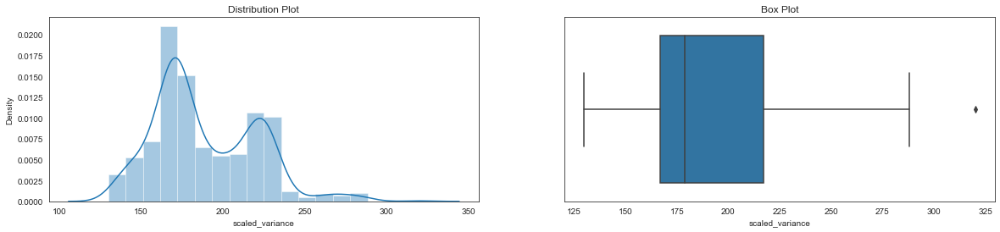

In [231]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['scaled_variance'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['scaled_variance'],ax=ax2)
ax2.set_title("Box Plot")

In [233]:
findOutlier(vehicle_df_Imputed['scaled_variance'])

25th Quantile value:  167.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: scaled_variance, dtype: float64)
75th Quantile value:  217.0
Outlier High Count =  1
List of High outliers: 

388   320.0000000
Name: scaled_variance, dtype: float64


In [234]:
vehicle_df_Imputed.loc[[388]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
388,94,47.0000000,85.0000000,250.0000000,72.0000000,12,155.0000000,43.0000000,19.0000000,155,320.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van


In [235]:
## Treating Higher outlier

vehicle_df_Imputed[vehicle_df_Imputed['class'] =='van']['scaled_variance'].sort_values(ascending =False).head(8)

388   320.0000000
37    272.0000000
706   231.0000000
135   229.0000000
523   200.0000000
291   200.0000000
311   180.0000000
45    180.0000000
Name: scaled_variance, dtype: float64

In [236]:
# We can see the next large value other than higher outlier limit is 272
# values of max.length_aspect_ratio for lower outlier can be replace with 272

vehicle_df_Imputed.loc[[388],'scaled_variance']=272

In [237]:
##Doubly Check
vehicle_df_Imputed.loc[[388]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
388,94,47.0000000,85.0000000,250.0000000,72.0000000,12,155.0000000,43.0000000,19.0000000,155,272.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van


<font color=darkblue>
    
# Observations:
   - scaled_variance is Positively distributed and Bimodal.
   - There are a outliers, We have treated with the next maximum value than outlier

## Measure of skewness of  ‘scaled_variance.1’

In [238]:
scaled_variance_1_mode =vehicle_df_Imputed['scaled_variance.1'].mode()
scaled_variance_1_median = vehicle_df_Imputed['scaled_variance.1'].median()
scaled_variance_1_mean = vehicle_df_Imputed['scaled_variance.1'].mean()
print('Mode :',scaled_variance_1_mode)
print('Median :',scaled_variance_1_median)
print('Mean:',scaled_variance_1_mean)
print ('Skewness on scaled_variance.1 :',vehicle_df_Imputed.skew()['scaled_variance.1'])

if(scaled_variance_1_mean > scaled_variance_1_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   327.0000000
1   330.0000000
2   333.0000000
dtype: float64
Median : 363.5
Mean: 439.3144208037825
Skewness on scaled_variance.1 : 0.8453454281630146
Then the distribution is positively skewed.


In [239]:
IQR_scaled_variance_1 = vehicle_df_Imputed["scaled_variance.1"].quantile(0.75) - vehicle_df_Imputed["scaled_variance.1"].quantile(0.25)

print('IQR_scaled_variance_1 -',IQR_scaled_variance_1)

high_Wiskers_outlier = vehicle_df_Imputed["scaled_variance.1"].quantile(0.75) + 1.5*IQR_scaled_variance_1
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["scaled_variance.1"].quantile(0.25)  - 1.5*IQR_scaled_variance_1
print('Lower outliers <',low_Wiskers_outlier)

IQR_scaled_variance_1 - 268.5
Higher outliers > 989.5
Lower outliers < -84.5


Text(0.5, 1.0, 'Box Plot')

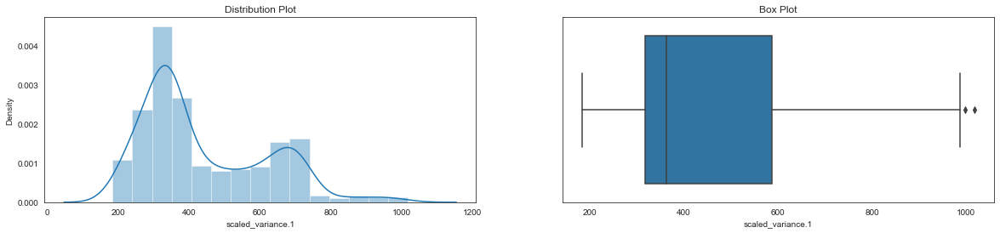

In [240]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['scaled_variance.1'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['scaled_variance.1'],ax=ax2)
ax2.set_title("Box Plot")

In [241]:
findOutlier(vehicle_df_Imputed['scaled_variance.1'])

25th Quantile value:  318.25
Outlier low Count = 0
List of Low outliers: 

Series([], Name: scaled_variance.1, dtype: float64)
75th Quantile value:  586.75
Outlier High Count =  2
List of High outliers: 

85     998.0000000
835   1018.0000000
Name: scaled_variance.1, dtype: float64


In [242]:
## On observing the below rows we are seeing the vehicle type as bus

vehicle_df_Imputed.loc[[85,835]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
85,110,58.0000000,106.0000000,180.0000000,51.0000000,6,261.0000000,26.0000000,28.0000000,171,278.0000000,998.0000000,257.0000000,83.0000000,9.0000000,13.0000000,181.0000000,182,bus
835,111,58.0000000,105.0000000,183.0000000,51.0000000,6,265.0000000,26.0000000,29.0000000,174,285.0000000,1018.0000000,255.0000000,85.0000000,4.0000000,8.0000000,181.0000000,183,bus


In [243]:
## Treating Higher outlier

vehicle_df_Imputed[vehicle_df_Imputed['class'] =='bus']['scaled_variance.1'].sort_values(ascending =False).head(8)

835   1018.0000000
85     998.0000000
687    987.0000000
321    982.0000000
733    968.0000000
396    966.0000000
5      957.0000000
54     956.0000000
Name: scaled_variance.1, dtype: float64

In [244]:
# We can see the next large value other than higher outlier limit is 987
# values of scaled_variance.1 for lower outlier can be replace with 987

vehicle_df_Imputed.loc[[85,835],'scaled_variance.1']=272

In [245]:
## Double Check
vehicle_df_Imputed.loc[[85,835]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
85,110,58.0000000,106.0000000,180.0000000,51.0000000,6,261.0000000,26.0000000,28.0000000,171,278.0000000,272.0000000,257.0000000,83.0000000,9.0000000,13.0000000,181.0000000,182,bus
835,111,58.0000000,105.0000000,183.0000000,51.0000000,6,265.0000000,26.0000000,29.0000000,174,285.0000000,272.0000000,255.0000000,85.0000000,4.0000000,8.0000000,181.0000000,183,bus


<font color=darkblue>
    
# Observations:
   - scaled_variance.1 is Positively distributed and Bimodal.
   - There are 2 values higher than higher outlier.

## Measure of skewness of  ‘scaled_radius_of_gyration’

In [246]:
scaled_radius_of_gyration_mode =vehicle_df_Imputed['scaled_radius_of_gyration'].mode()
scaled_radius_of_gyration_median = vehicle_df_Imputed['scaled_radius_of_gyration'].median()
scaled_radius_of_gyration_mean = vehicle_df_Imputed['scaled_radius_of_gyration'].mean()
print('Mode :',scaled_radius_of_gyration_mode)
print('Median :',scaled_radius_of_gyration_median)
print('Mean:',scaled_radius_of_gyration_mean)
print ('Skewness on scaled_radius_of_gyration :',vehicle_df_Imputed.skew()['scaled_radius_of_gyration'])

if(scaled_radius_of_gyration_mean > scaled_radius_of_gyration_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   186.0000000
dtype: float64
Median : 173.5
Mean: 174.70685579196217
Skewness on scaled_radius_of_gyration : 0.27990964799345835
Then the distribution is positively skewed.


In [247]:
IQR_scaled_radius_of_gyration = vehicle_df_Imputed["scaled_radius_of_gyration"].quantile(0.75) - vehicle_df_Imputed["scaled_radius_of_gyration"].quantile(0.25)

print('IQR_scaled_radius_of_gyration -',IQR_scaled_radius_of_gyration)

high_Wiskers_outlier = vehicle_df_Imputed["scaled_radius_of_gyration"].quantile(0.75) + 1.5*IQR_scaled_radius_of_gyration
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["scaled_radius_of_gyration"].quantile(0.25)  - 1.5*IQR_scaled_radius_of_gyration
print('Lower outliers <',low_Wiskers_outlier)

IQR_scaled_radius_of_gyration - 49.0
Higher outliers > 271.5
Lower outliers < 75.5


Text(0.5, 1.0, 'Box Plot')

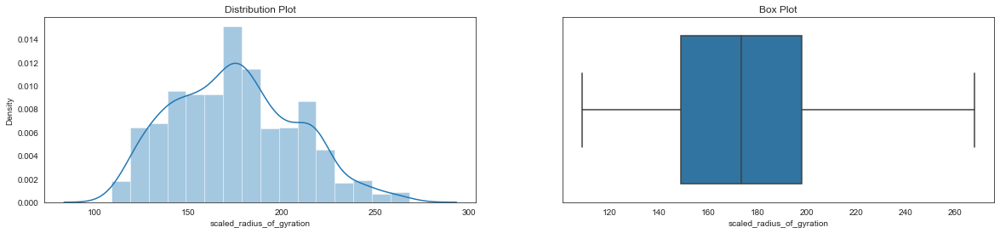

In [248]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['scaled_radius_of_gyration'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['scaled_radius_of_gyration'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - scaled_radius_of_gyration is Positively distributed.
   - No Outliers.

## Measure of skewness of  ‘scaled_radius_of_gyration.1’

In [249]:
scaled_radius_of_gyration_1_mode =vehicle_df_Imputed['scaled_radius_of_gyration.1'].mode()
scaled_radius_of_gyration_1_median = vehicle_df_Imputed['scaled_radius_of_gyration.1'].median()
scaled_radius_of_gyration_1_mean = vehicle_df_Imputed['scaled_radius_of_gyration.1'].mean()
print('Mode :',scaled_radius_of_gyration_1_mode)
print('Median :',scaled_radius_of_gyration_1_median)
print('Mean:',scaled_radius_of_gyration_1_mean)
print ('Skewness on scaled_radius_of_gyration.1 :',vehicle_df_Imputed.skew()['scaled_radius_of_gyration.1'])

if(scaled_radius_of_gyration_1_mean > scaled_radius_of_gyration_1_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   72.0000000
dtype: float64
Median : 71.5
Mean: 72.44326241134752
Skewness on scaled_radius_of_gyration.1 : 2.0899787533912066
Then the distribution is positively skewed.


In [250]:
IQR_scaled_radius_of_gyration_1 = vehicle_df_Imputed["scaled_radius_of_gyration.1"].quantile(0.75) - vehicle_df_Imputed["scaled_radius_of_gyration.1"].quantile(0.25)

print('IQR_scaled_radius_of_gyration_1 -',IQR_scaled_radius_of_gyration_1)

high_Wiskers_outlier = vehicle_df_Imputed["scaled_radius_of_gyration.1"].quantile(0.75) + 1.5*IQR_scaled_radius_of_gyration_1
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["scaled_radius_of_gyration.1"].quantile(0.25)  - 1.5*IQR_scaled_radius_of_gyration_1
print('Lower outliers <',low_Wiskers_outlier)

IQR_scaled_radius_of_gyration_1 - 8.0
Higher outliers > 87.0
Lower outliers < 55.0


Text(0.5, 1.0, 'Box Plot')

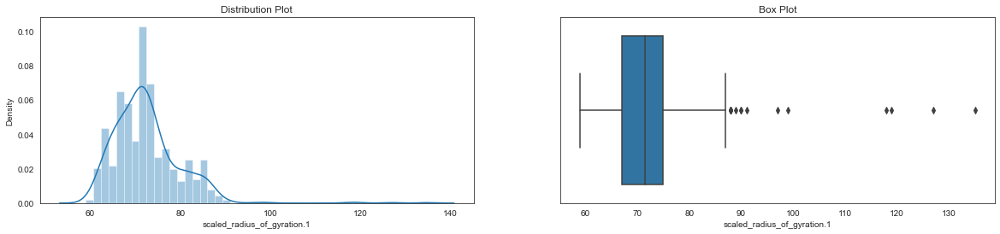

In [251]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['scaled_radius_of_gyration.1'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['scaled_radius_of_gyration.1'],ax=ax2)
ax2.set_title("Box Plot")

In [252]:
findOutlier(vehicle_df_Imputed['scaled_radius_of_gyration.1'])

25th Quantile value:  67.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: scaled_radius_of_gyration.1, dtype: float64)
75th Quantile value:  75.0
Outlier High Count =  15
List of High outliers: 

4     127.0000000
37    118.0000000
47     88.0000000
79     88.0000000
100   119.0000000
135    97.0000000
230    89.0000000
291    90.0000000
381    88.0000000
388   135.0000000
498    88.0000000
523    91.0000000
655    90.0000000
706    99.0000000
815    88.0000000
Name: scaled_radius_of_gyration.1, dtype: float64


In [254]:
# Lets observe full row for this outliers
vehicle_df_Imputed.loc[[4,37,47,79,100,135,230,291,381,388,498,523,655,706,815]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
4,85,44.0000000,70.0000000,205.0000000,76.0000000,8,149.0000000,45.0000000,19.0000000,144,241.0000000,325.0000000,188.0000000,127.0000000,9.0000000,11.0000000,180.0000000,183,bus
37,90,48.0000000,86.0000000,250.0000000,72.0000000,12,153.0000000,44.0000000,19.0000000,156,272.0000000,346.0000000,200.0000000,118.0000000,0.0000000,15.0000000,185.0000000,194,van
47,85,42.0000000,66.0000000,122.0000000,54.0000000,6,148.0000000,46.0000000,19.0000000,141,172.0000000,317.0000000,174.0000000,88.0000000,6.0000000,14.0000000,180.0000000,182,bus
79,89,44.0000000,68.0000000,113.0000000,50.0000000,7,150.0000000,45.0000000,19.0000000,147,171.0000000,328.0000000,189.0000000,88.0000000,6.0000000,5.0000000,179.0000000,182,bus
100,82,45.0000000,66.0000000,252.0000000,76.0000000,8,148.0000000,45.0000000,19.0000000,144,237.0000000,326.0000000,185.0000000,119.0000000,1.0000000,1.0000000,181.0000000,185,bus
135,89,47.0000000,83.0000000,250.0000000,72.0000000,12,158.0000000,43.0000000,20.0000000,163,229.0000000,364.0000000,176.0000000,97.0000000,0.0000000,14.0000000,184.0000000,194,van
230,85,35.0000000,47.0000000,110.0000000,55.0000000,3,117.0000000,57.0000000,17.0000000,122,136.0000000,203.0000000,139.0000000,89.0000000,5.0000000,9.0000000,180.0000000,184,van
291,89,45.0000000,81.0000000,246.0000000,72.0000000,12,155.0000000,44.0000000,20.0000000,160,200.0000000,347.0000000,177.0000000,90.0000000,9.0000000,17.0000000,183.0000000,192,van
381,106,54.0000000,100.0000000,227.0000000,67.0000000,4,250.0000000,27.0000000,27.0000000,162,280.0000000,923.0000000,262.0000000,88.0000000,5.0000000,11.0000000,182.0000000,182,bus
388,94,47.0000000,85.0000000,250.0000000,72.0000000,12,155.0000000,43.0000000,19.0000000,155,272.0000000,354.0000000,187.0000000,135.0000000,12.0000000,9.0000000,188.0000000,196,van


In [226]:
# Values ouliers are almost in range of max. We will leave them as such

## Measure of skewness of  ‘skewness_about’

In [255]:
skewness_about_mode =vehicle_df_Imputed['skewness_about'].mode()
skewness_about_median = vehicle_df_Imputed['skewness_about'].median()
skewness_about_mean = vehicle_df_Imputed['skewness_about'].mean()
print('Mode :',skewness_about_mode)
print('Median :',skewness_about_median)
print('Mean:',skewness_about_mean)
print ('Skewness on skewness_about :',vehicle_df_Imputed.skew()['skewness_about'])

if(skewness_about_mean > skewness_about_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   1.0000000
dtype: float64
Median : 6.0
Mean: 6.361702127659575
Skewness on skewness_about : 0.7808132397211246
Then the distribution is positively skewed.


In [256]:
IQR_skewness_about = vehicle_df_Imputed["skewness_about"].quantile(0.75) - vehicle_df_Imputed["skewness_about"].quantile(0.25)

print('IQR_skewness_about -',IQR_skewness_about)

high_Wiskers_outlier = vehicle_df_Imputed["skewness_about"].quantile(0.75) + 1.5*IQR_skewness_about
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["skewness_about"].quantile(0.25)  - 1.5*IQR_skewness_about
print('Lower outliers <',low_Wiskers_outlier)

IQR_skewness_about - 7.0
Higher outliers > 19.5
Lower outliers < -8.5


Text(0.5, 1.0, 'Box Plot')

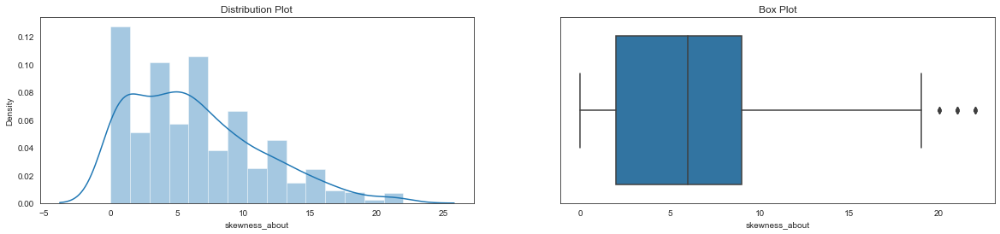

In [257]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['skewness_about'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['skewness_about'],ax=ax2)
ax2.set_title("Box Plot")

In [259]:
findOutlier(vehicle_df_Imputed['skewness_about'])

25th Quantile value:  2.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: skewness_about, dtype: float64)
75th Quantile value:  9.0
Outlier High Count =  12
List of High outliers: 

44    20.0000000
113   21.0000000
123   22.0000000
190   20.0000000
346   21.0000000
400   21.0000000
505   21.0000000
516   22.0000000
623   22.0000000
761   22.0000000
796   20.0000000
797   21.0000000
Name: skewness_about, dtype: float64


In [260]:
# Lets observe full row for this outliers
vehicle_df_Imputed.loc[[44,113,123,190,346,400,505,516,623,761,796,797]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
44,119,54.0000000,106.0000000,220.0000000,65.0000000,12,213.0000000,31.0000000,24.0000000,167,223.0000000,675.0000000,232.0000000,66.0000000,20.0000000,1.0000000,192.0000000,202,car
113,88,35.0000000,50.0000000,121.0000000,58.0000000,5,114.0000000,59.0000000,17.0000000,122,132.0000000,192.0000000,138.0000000,74.0000000,21.0000000,4.0000000,182.0000000,187,car
123,90,36.0000000,57.0000000,130.0000000,57.0000000,6,121.0000000,56.0000000,17.0000000,127,137.0000000,216.0000000,132.0000000,68.0000000,22.0000000,23.0000000,190.0000000,195,car
190,97,48.0000000,94.0000000,198.0000000,63.0000000,9,181.0000000,36.0000000,21.0000000,155,200.0000000,494.0000000,189.0000000,64.0000000,20.0000000,11.0000000,199.0000000,203,car
346,117,52.0000000,110.0000000,228.0000000,65.0000000,12,212.0000000,31.0000000,24.0000000,163,228.0000000,668.0000000,220.0000000,66.0000000,21.0000000,25.0000000,194.0000000,205,car
400,107,53.0000000,108.0000000,213.0000000,64.0000000,12,206.0000000,32.0000000,23.0000000,163,216.0000000,627.0000000,202.0000000,65.0000000,21.0000000,22.0000000,194.0000000,205,car
505,115,53.0000000,100.0000000,205.0000000,64.0000000,11,220.0000000,30.0000000,25.0000000,166,229.0000000,710.0000000,214.0000000,71.0000000,21.0000000,11.0000000,189.0000000,199,car
516,92,42.0000000,75.0000000,172.0000000,60.0000000,8,147.0000000,45.0000000,19.0000000,142,174.0000000,322.0000000,160.0000000,62.0000000,22.0000000,10.0000000,206.0000000,211,car
623,106,52.0000000,108.0000000,207.0000000,64.0000000,12,221.0000000,31.0000000,25.0000000,168,229.0000000,709.0000000,200.0000000,73.0000000,22.0000000,38.0000000,190.0000000,205,car
761,115,51.0000000,100.0000000,201.0000000,60.0000000,12,196.0000000,34.0000000,23.0000000,162,207.0000000,573.0000000,184.0000000,62.0000000,22.0000000,1.0000000,198.0000000,208,car


In [232]:
# We can see all the outliers are about vehicle type car.

In [261]:

vehicle_df_Imputed[vehicle_df_Imputed['class'] =='car']['skewness_about'].sort_values(ascending =False).head(15)

761   22.0000000
123   22.0000000
623   22.0000000
516   22.0000000
113   21.0000000
797   21.0000000
346   21.0000000
400   21.0000000
505   21.0000000
44    20.0000000
796   20.0000000
190   20.0000000
326   19.0000000
196   19.0000000
662   19.0000000
Name: skewness_about, dtype: float64

In [262]:
# We can see the next large value other than higher outlier limit is 19
# values of skewness_about for lower outlier can be replace with 19

vehicle_df_Imputed.loc[[44,113,123,190,346,400,505,516,623,761,796,797],'skewness_about']=19

In [263]:
# Double Check

vehicle_df_Imputed.loc[[44,113,123,190,346,400,505,516,623,761,796,797]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
44,119,54.0000000,106.0000000,220.0000000,65.0000000,12,213.0000000,31.0000000,24.0000000,167,223.0000000,675.0000000,232.0000000,66.0000000,19.0000000,1.0000000,192.0000000,202,car
113,88,35.0000000,50.0000000,121.0000000,58.0000000,5,114.0000000,59.0000000,17.0000000,122,132.0000000,192.0000000,138.0000000,74.0000000,19.0000000,4.0000000,182.0000000,187,car
123,90,36.0000000,57.0000000,130.0000000,57.0000000,6,121.0000000,56.0000000,17.0000000,127,137.0000000,216.0000000,132.0000000,68.0000000,19.0000000,23.0000000,190.0000000,195,car
190,97,48.0000000,94.0000000,198.0000000,63.0000000,9,181.0000000,36.0000000,21.0000000,155,200.0000000,494.0000000,189.0000000,64.0000000,19.0000000,11.0000000,199.0000000,203,car
346,117,52.0000000,110.0000000,228.0000000,65.0000000,12,212.0000000,31.0000000,24.0000000,163,228.0000000,668.0000000,220.0000000,66.0000000,19.0000000,25.0000000,194.0000000,205,car
400,107,53.0000000,108.0000000,213.0000000,64.0000000,12,206.0000000,32.0000000,23.0000000,163,216.0000000,627.0000000,202.0000000,65.0000000,19.0000000,22.0000000,194.0000000,205,car
505,115,53.0000000,100.0000000,205.0000000,64.0000000,11,220.0000000,30.0000000,25.0000000,166,229.0000000,710.0000000,214.0000000,71.0000000,19.0000000,11.0000000,189.0000000,199,car
516,92,42.0000000,75.0000000,172.0000000,60.0000000,8,147.0000000,45.0000000,19.0000000,142,174.0000000,322.0000000,160.0000000,62.0000000,19.0000000,10.0000000,206.0000000,211,car
623,106,52.0000000,108.0000000,207.0000000,64.0000000,12,221.0000000,31.0000000,25.0000000,168,229.0000000,709.0000000,200.0000000,73.0000000,19.0000000,38.0000000,190.0000000,205,car
761,115,51.0000000,100.0000000,201.0000000,60.0000000,12,196.0000000,34.0000000,23.0000000,162,207.0000000,573.0000000,184.0000000,62.0000000,19.0000000,1.0000000,198.0000000,208,car


<font color=darkblue>
    
# Observations:
   - skewness_about is Positively distributed.
   - There are 12 Outliers and they have been handled above.

## Measure of skewness of  ‘skewness_about.1’

In [264]:
skewness_about_1_mode =vehicle_df_Imputed['skewness_about.1'].mode()
skewness_about_1_median = vehicle_df_Imputed['skewness_about.1'].median()
skewness_about_1_mean = vehicle_df_Imputed['skewness_about.1'].mean()
print('Mode :',skewness_about_1_mode)
print('Median :',skewness_about_1_median)
print('Mean:',skewness_about_1_mean)
print ('Skewness on skewness_about_1 :',vehicle_df_Imputed.skew()['skewness_about.1'])

if(skewness_about_1_mean > skewness_about_1_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   11.0000000
dtype: float64
Median : 11.0
Mean: 12.60047281323877
Skewness on skewness_about_1 : 0.6890143067342678
Then the distribution is positively skewed.


In [265]:
IQR_skewness_about_1 = vehicle_df_Imputed["skewness_about.1"].quantile(0.75) - vehicle_df_Imputed["skewness_about.1"].quantile(0.25)

print('IQR_skewness_about_1 -',IQR_skewness_about_1)

high_Wiskers_outlier = vehicle_df_Imputed["skewness_about.1"].quantile(0.75) + 1.5*IQR_skewness_about_1
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["skewness_about.1"].quantile(0.25)  - 1.5*IQR_skewness_about_1
print('Lower outliers <',low_Wiskers_outlier)

IQR_skewness_about_1 - 14.0
Higher outliers > 40.0
Lower outliers < -16.0


Text(0.5, 1.0, 'Box Plot')

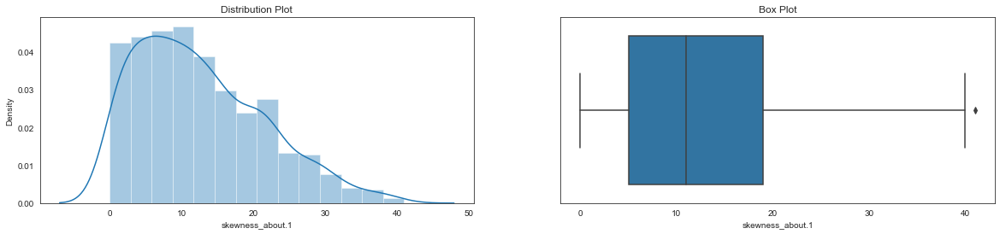

In [266]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['skewness_about.1'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['skewness_about.1'],ax=ax2)
ax2.set_title("Box Plot")

In [267]:
findOutlier(vehicle_df_Imputed['skewness_about.1'])

25th Quantile value:  5.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: skewness_about.1, dtype: float64)
75th Quantile value:  19.0
Outlier High Count =  1
List of High outliers: 

132   41.0000000
Name: skewness_about.1, dtype: float64


In [268]:
# Lets observe full row for this outliers
vehicle_df_Imputed.loc[[132]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
132,97,42.0000000,101.0000000,186.0000000,59.0000000,9,186.0000000,36.0000000,22.0000000,138,208.0000000,511.0000000,168.0000000,67.0000000,7.0000000,41.0000000,194.0000000,206,car


In [269]:

vehicle_df_Imputed[vehicle_df_Imputed['class'] =='car']['skewness_about.1'].sort_values(ascending =False).head(5)

132   41.0000000
513   40.0000000
142   39.0000000
98    38.0000000
361   38.0000000
Name: skewness_about.1, dtype: float64

In [270]:
## Will replace the Outlier row 132 with  next highest value = 40
vehicle_df_Imputed.loc[[132],'skewness_about.1'] = 40

In [244]:
vehicle_df_Imputed.loc[[132]]

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
132,97,42.0000000,101.0000000,186.0000000,59.0000000,9,186.0000000,36.0000000,22.0000000,138,208.0000000,511.0000000,168.0000000,67.0000000,7.0000000,40.0000000,194.0000000,206,car


<font color=darkblue>
    
# Observations:
   - skewness_about.1 is Positively distributed.
   - There are 1 Outliers and they have been handled above.

## Measure of skewness of  ‘skewness_about.2’

In [271]:
skewness_about_2_mode =vehicle_df_Imputed['skewness_about.2'].mode()
skewness_about_2_median = vehicle_df_Imputed['skewness_about.2'].median()
skewness_about_2_mean = vehicle_df_Imputed['skewness_about.2'].mean()
print('Mode :',skewness_about_2_mode)
print('Median :',skewness_about_2_median)
print('Mean:',skewness_about_2_mean)
print ('Skewness on skewness_about_2 :',vehicle_df_Imputed.skew()['skewness_about.2'])

if(skewness_about_2_mean > skewness_about_2_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.') 

Mode : 0   188.0000000
dtype: float64
Median : 188.0
Mean: 188.91843971631207
Skewness on skewness_about_2 : 0.24998506992542593
Then the distribution is positively skewed.


In [272]:
IQR_skewness_about_2 = vehicle_df_Imputed["skewness_about.2"].quantile(0.75) - vehicle_df_Imputed["skewness_about.1"].quantile(0.25)

print('IQR_skewness_about_2 -',IQR_skewness_about_2)

high_Wiskers_outlier = vehicle_df_Imputed["skewness_about.2"].quantile(0.75) + 1.5*IQR_skewness_about_2
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["skewness_about.2"].quantile(0.25)  - 1.5*IQR_skewness_about_2
print('Lower outliers <',low_Wiskers_outlier)

IQR_skewness_about_2 - 188.0
Higher outliers > 475.0
Lower outliers < -98.0


Text(0.5, 1.0, 'Box Plot')

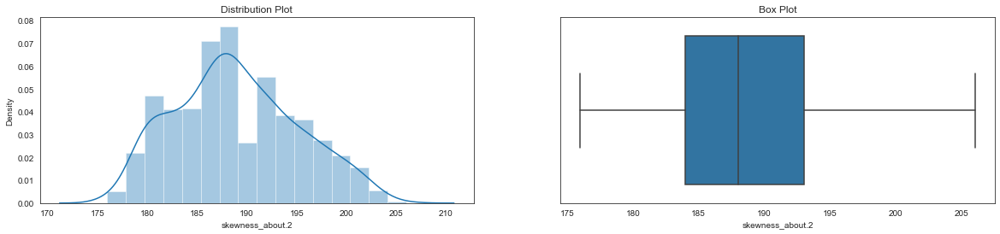

In [273]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['skewness_about.2'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['skewness_about.2'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - skewness_about.1 is Positively distributed.
   - There are no Outliers.

## Measure of skewness of  ‘hollows_ratio’

In [274]:
hollows_ratio_mode =vehicle_df_Imputed['hollows_ratio'].mode()
hollows_ratio_median = vehicle_df_Imputed['hollows_ratio'].median()
hollows_ratio_mean = vehicle_df_Imputed['hollows_ratio'].mean()
print('Mode :',hollows_ratio_mode)
print('Median :',hollows_ratio_median)
print('Mean:',hollows_ratio_mean)
print ('Skewness on hollows_ratio :',vehicle_df_Imputed.skew()['hollows_ratio'])

if(hollows_ratio_mean > hollows_ratio_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0    198
dtype: int64
Median : 197.0
Mean: 195.63238770685578
Skewness on hollows_ratio : -0.22634128032982512
Then the distribution is negatively skewed.


In [275]:
IQR_hollows_ratio = vehicle_df_Imputed["hollows_ratio"].quantile(0.75) - vehicle_df_Imputed["hollows_ratio"].quantile(0.25)

print('IQR_hollows_ratio -',IQR_hollows_ratio)

high_Wiskers_outlier = vehicle_df_Imputed["hollows_ratio"].quantile(0.75) + 1.5*IQR_hollows_ratio
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = vehicle_df_Imputed["hollows_ratio"].quantile(0.25)  - 1.5*IQR_hollows_ratio
print('Lower outliers <',low_Wiskers_outlier)

IQR_hollows_ratio - 10.75
Higher outliers > 217.125
Lower outliers < 174.125


Text(0.5, 1.0, 'Box Plot')

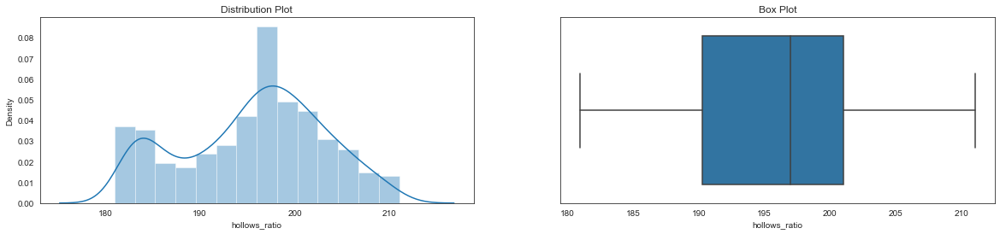

In [276]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(vehicle_df_Imputed['hollows_ratio'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(vehicle_df_Imputed['hollows_ratio'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
   - hollows_ratio is Negatively distributed.
   - There are no Outliers.

## MultiVariant Analysis

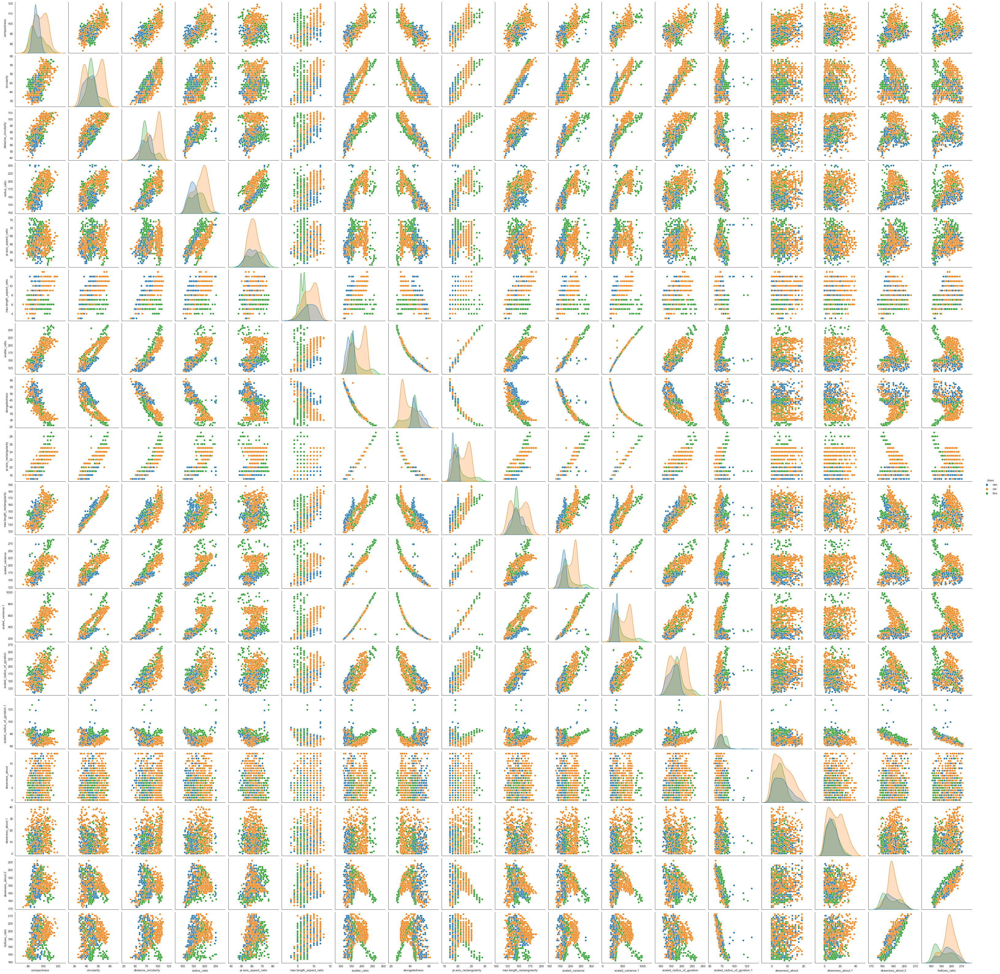

In [277]:
sns.pairplot(vehicle_df_Imputed,diag_kind='kde',hue='class')

<font color=darkblue>

# Observation:
   - Spread of compactness is least for van. mean compactness is highest for car. For Bus compactness is right skewed indicating that less number of buses have high compactness.
   - Mean circularity is higher for cars
   - Mean distance_circularity is also higher for cars
   - Mean radius_ratio is higher for cars, followed by Bus. It is least for vans
   - pr.axis_aspect_ratio is has almost same distribution for car, van and buses
   - max.length_aspect_ratio is almost same for cars and vans, lower for buses
   - Mean scatter ratio is highest for cars, followed by bus and van
   - Mean elomngatedness is highest for vans folowed by bus and car
   - pr.axis_rectangularity is highest for cars, followed by bus and then vans
   - distribution of max.length_rectangularity is almost same for cars, bus and vans
   - Mean scaled variance is highest for cars followed by bus then vans
   - Mean scaled variance1 is highest for cars followed by bus then vans
   - 'scaled_radius_of_gyration', 'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1', 'skewness_about.2', have almost similar distribution for cars, buses and vans.
   - 'hollows_ratio' is lower for buses as compared to cars and vans
   - Many columns have lonmg tails indicating outliers
   - pr.axis_aspect ratio and radius ratio varies strongly +ve for van. for cars and buses it varies in small range- mostly could like
    - Scatter ratio & Scaled_variance1 has almost perfect positive linear relationship
    - Many features show high correlation indicating that we need to drop multiple features- we will use PCA for the same

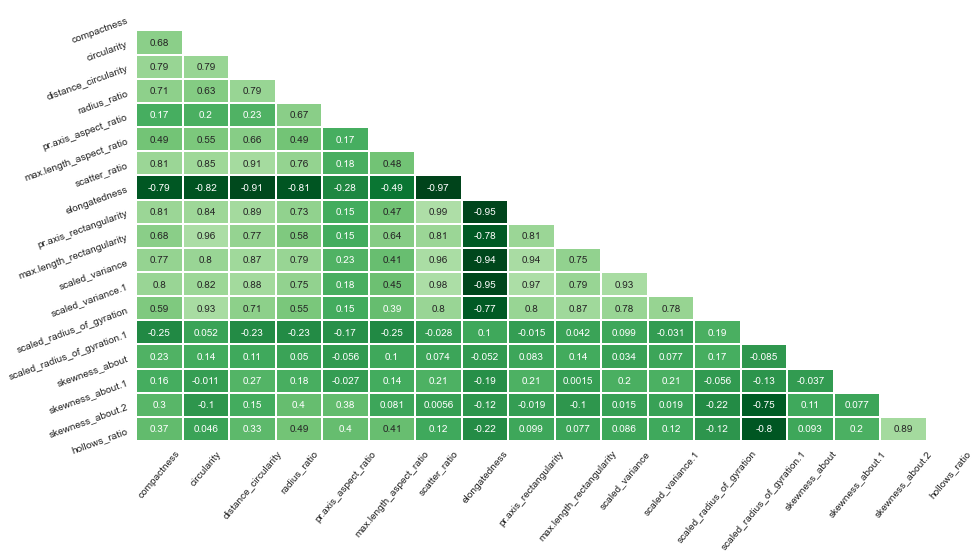

In [278]:
# Heatmap
#Correlation Matrix
corr = vehicle_df_Imputed.corr() # correlation matrix
lower_triangle = np.tril(corr, k = -1)  # select only the lower triangle of the correlation matrix
mask = lower_triangle == 0  # to mask the upper triangle in the following heatmap

plt.figure(figsize = (15,8))  # setting the figure size
sns.set_style(style = 'white')  # Setting it to white so that we do not see the grid lines
sns.heatmap(lower_triangle, center=0.5, cmap= 'Greens_r', annot= True, xticklabels = corr.index, yticklabels = corr.columns,
            cbar= False, linewidths= 1, mask = mask)   # Da Heatmap
plt.xticks(rotation = 50)   # Aesthetic purposes
plt.yticks(rotation = 20)   # Aesthetic purposes
plt.show()

<font color=darkblue>

# Observations:
 - From above correlation matrix we can see that there are many features which are highly correlated.
 - Highly Correlated Features are below.
   - distance_circularity vs compactness.
   - distance_circularity vs circularity.
   - pr.axis_aspect_ratio vs radius_ratio.
   - pr.axis_rectangularity vs scatter_ratio.
   - scaled_variance vs scatter_ratio.
   - scaled_variance vs  pr.axis_rectangularity
   
 - Less Correlated Features are below for samples.
     - elongatedness vs compactness
     - elongatedness vs circularity
     - elongatedness vs distance_circularity
     - elongatedness vs radius_ratio
     - elongatedness vs scatter_ratio
     
 - if we see carefully then scaled_variance.1 and scatter_ratio has correlation of 1 and many other features are also there which having more than 0.9(positive or negative) correlation e.g sekweness_abou2 and hollows_ratio, scaled variance & scaled_variance1, elongatedness & scaled variance, elongatedness & scaled variance1 etc.
 - There are lot of dimensions with correlation above +- 0.7 and it is difficult to determine which dimensions to drop manually. We will use PCA to determine it.

<font color=darkblue>

#  3.Classifier: Design and train a best fit SVM classier using all the data attributes.

In [279]:
#Split into Train -Test set

target = vehicle_df_Imputed["class"]
features = vehicle_df_Imputed.drop(["class"], axis=1)
X_train, X_test, y_train, y_test = train_test_split(features,target, test_size = 0.2, random_state = 10)

In [280]:
X_train.shape

(676, 18)

In [281]:
X_test.shape

(170, 18)

In [282]:
# Building a Support Vector Machine on train data
from sklearn.svm import SVC

svc_model = SVC(C= .1, kernel='linear', gamma= 1)
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

In [283]:
# check the accuracy on the training set
print(svc_model.score(X_train, y_train))
print(svc_model.score(X_test, y_test))

0.9792899408284024
0.9352941176470588


In [284]:
print("Confusion Matrix:\n",confusion_matrix(prediction,y_test))

Confusion Matrix:
 [[42  5  0]
 [ 1 81  1]
 [ 1  3 36]]


In [285]:
print("classification Report:\n",classification_report(y_test,prediction))

classification Report:
               precision    recall  f1-score   support

         bus       0.89      0.95      0.92        44
         car       0.98      0.91      0.94        89
         van       0.90      0.97      0.94        37

    accuracy                           0.94       170
   macro avg       0.92      0.95      0.93       170
weighted avg       0.94      0.94      0.94       170



<font color=darkblue>

# Observations:
 - Linear Kernel SVC classifier has a training accuracy of 97% and testing accuracy of 93%.
 - Looking at the confusion matrix, model predicts all the bus correctly from the total vehicle count of 170 from the Silhoutte(89%) = 42/47
 - cars are predicted correctly(98.0%) 
 - 36/40 vans are predicted correctly(90.0%)
 - The Recall% is also quite good as 95% for bus, 91% for car and 97% for van.

<font color=darkblue>

# 4. Dimensional reduction: perform dimensional reduction on the data.

In [287]:
X_train.shape,y_train.shape, X_test.shape, y_test.shape

((676, 18), (676,), (170, 18), (170,))

In [288]:
#  Step 1: Standardize the Data set
sc = StandardScaler()
sc.fit(X_train) # Fit scaler in train set

StandardScaler()

In [289]:
# transform train set
#Transform X_train
X_train_std=sc.transform(X_train)

#Transform X_test ( with same fit as train) to prevent data leak
X_test_std=sc.transform(X_test)

In [291]:
# Step 2: Covariance Matrix
cov_matrix = np.cov(X_train_std.T)

print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[ 1.00148148  0.69100362  0.79310322  0.70103894  0.16995988  0.50989237
   0.81063233 -0.78475977  0.81329758  0.6899308   0.75775274  0.80404582
   0.59127062 -0.25706575  0.24226223  0.16598953  0.30573255  0.37699504]
 [ 0.69100362  1.00148148  0.78957672  0.64626518  0.22428726  0.55233346
   0.84660296 -0.8210884   0.84106246  0.96297089  0.79955754  0.827457
   0.92494693  0.04135158  0.14787593  0.00486593 -0.08196764  0.06721806]
 [ 0.79310322  0.78957672  1.00148148  0.7834531   0.23251261  0.67087228
   0.90531869 -0.91102111  0.89432078  0.77825555  0.86320036  0.88401923
   0.70505227 -0.22551163  0.11858717  0.27975493  0.15590587  0.34427571]
 [ 0.70103894  0.64626518  0.7834531   1.00148148  0.67694655  0.51665194
   0.75642007 -0.81077312  0.73096131  0.59972075  0.79625127  0.74239063
   0.55782668 -0.20190509  0.04647296  0.18632005  0.3913109   0.48934817]
 [ 0.16995988  0.22428726  0.23251261  0.67694655  1.00148148  0.19913359
   0.18501816 

In [292]:
# Step 3: Get the Eigen Values and Eigen Vectors

eig_vals, eig_vecs = np.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s', eig_vecs)
print('\n Eigen Values \n%s', eig_vals)

Eigen Vectors 
%s [[-2.72101906e-01  9.72469349e-02  1.71984016e-01  8.31370208e-02
   1.11729477e-01  1.57868507e-01  3.19601676e-01  3.35280675e-01
   7.23234955e-01  2.73478511e-01  1.85793562e-02 -1.86977662e-02
   9.01397697e-02  7.37447763e-02  9.48964503e-02 -5.03117090e-02
  -4.08263589e-02 -5.22307890e-02]
 [-2.87380891e-01 -1.29375149e-01 -6.10460152e-02  1.92200191e-01
  -1.48250832e-01 -2.05531219e-02 -3.60503195e-01  1.98692520e-01
   3.02111077e-02 -8.38685935e-02 -1.84950145e-01 -3.42979748e-02
  -2.31415408e-01  3.77747774e-02  2.61541648e-01 -4.42265577e-01
  -2.57698428e-02  5.52438423e-01]
 [-3.01816564e-01  5.10193570e-02  1.07841971e-01 -6.74594964e-02
  -9.49471610e-02 -2.77444272e-02  8.25190979e-02 -2.51134794e-01
  -1.80575006e-01  4.02357137e-01 -6.64216841e-01  2.39048242e-02
   3.45820555e-01 -1.72718152e-01 -8.86200647e-02 -4.58790288e-02
   1.19052296e-01  2.55145327e-02]
 [-2.68346274e-01  1.78438558e-01 -2.93092429e-01 -8.46293392e-02
   1.70299636e-01 -

In [293]:
print("Eigen Values:")
pd.DataFrame(eig_vals).transpose()

Eigen Values:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,9.7572229,3.1028185,1.2277969,1.1780652,0.8287978,0.7516580,0.3658026,0.2660276,0.1926286,0.0938866,0.0636547,0.0053881,0.0512043,0.0451985,0.0328917,0.0249601,0.0187499,0.0199147


In [294]:
tot = sum(eig_vals)
var_exp = [( i /tot ) * 100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)   # array of size =  as many PC dimensions
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 54.12660639  71.33898727  78.14999054  84.68511542  89.28273612
  93.45243672  95.48166736  96.9574124   98.02598817  98.54680865
  98.89992251  99.18397002  99.43470137  99.61716281  99.75562476
  99.86609848  99.97011035 100.        ]


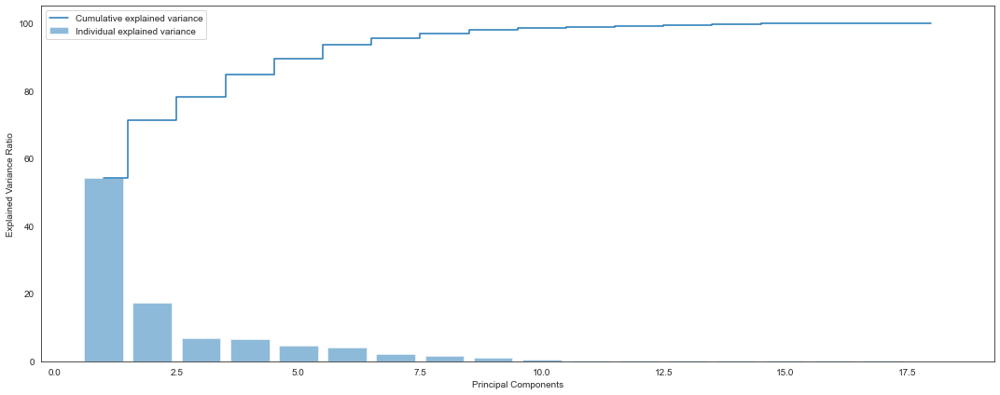

In [295]:
# Ploting 
plt.figure(figsize=(15 , 6))
plt.bar(range(1, eig_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, eig_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

 <font color=darkblue>

# Observations:
- From the above plot Cumulative Explained Variance is high from Column 8.
- First 8 principal components explain 98% of the variance in the data.
- There are more information available on column 1 to column 8 which contribute over 98%.
- For the PCA analysis, hence we are dropping column 9 to Column 17.

In [296]:
 # Make a set of (eigenvalue, eigenvector) pairs
    
eig_pairs = [(eig_vals[index], eig_vecs[index]) for index in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue by default take first field for sorting
eig_pairs.sort(reverse=True)


# Note: always form pair of eigen vector and values  first before sorting...

# Extract the descending ordered eigenvalues and eigenvectors
eigvalues_sorted = [eig_pairs[index][0] for index in range(len(eig_vals))]
eigvectors_sorted = [eig_pairs[index][1] for index in range(len(eig_vals))]

In [297]:
#Dimesionality reduction 

P_reduce = np.array(eigvectors_sorted[0:8]).transpose()   # Selecting first 8 eigen vector out if 18

Proj_train_data = np.dot(X_train_std,P_reduce)   # projecting training data onto the eight eigen vectors

Proj_test_data = np.dot(X_test_std,P_reduce)    # projecting test data onto the eight eigen vectors

In [298]:
#Check shapes of train and test new feature and target set after PCA
Proj_train_data.shape,y_train.shape,Proj_test_data.shape,y_test.shape

((676, 8), (676,), (170, 8), (170,))

In [325]:
## Using PCA to Dimensional Reduction

pca = PCA(n_components=8)

X_reduced = pd.DataFrame(pca.fit_transform(X_train_std))

print(X_reduced)

             0          1          2          3          4          5  \
0   -0.2129038 -1.4985128  0.3859875 -1.1445979 -0.6194901  0.7044091   
1    3.8366965 -0.0093060 -0.7541153 -0.5802198 -1.0324837 -1.2097379   
2   -0.2842387 -0.8158260 -1.0241914  3.1779928  0.9677051  0.6869369   
3   -2.3936476  1.4626984 -0.7464852  0.5726898  0.1650788  0.2180616   
4   -1.6111606  0.9850272  2.5435695 -0.9834323  0.5510823  0.5225150   
5    0.2630673  0.1982763  0.1691942  0.9754469  0.7247280 -2.6238812   
6    4.2229370 -0.2816915 -1.6201678 -2.2975436  0.0659199 -0.1775893   
7    3.8464492 -2.1231776 -1.5193130  1.2722973  0.4652421  0.5865141   
8    4.6591419  0.4594541 -2.1002072 -0.8370603  0.1616907  0.2563005   
9    4.6669246 -0.8691985  0.2644797  0.2612399 -0.2189228 -0.1474902   
10  -0.5363741  3.6274905  5.3483086  0.7257563  1.2099417  2.6682980   
11   0.8085809 -1.7547034 -0.6025700  0.8883317  0.9782863  0.9397905   
12  -1.4600038  0.8738597  1.8916258 -0.5428368 -0.

In [327]:
vectors = pca.components_.round(4)
#Print feature effects
print("PC 1 effects=" + str(dict(zip(features.columns,vectors[0]))),"\n")
print("PC 2 effects=" + str(dict(zip(features.columns,vectors[1]))),"\n")
print("PC 3 effects=" + str(dict(zip(features.columns,vectors[2]))),"\n")
print("PC 4 effects=" + str(dict(zip(features.columns,vectors[3]))),"\n")
print("PC 5 effects=" + str(dict(zip(features.columns,vectors[4]))),"\n")
print("PC 6 effects=" + str(dict(zip(features.columns,vectors[5]))),"\n")
print("PC 7 effects=" + str(dict(zip(features.columns,vectors[6]))),"\n")
print("PC 8 effects=" + str(dict(zip(features.columns,vectors[7]))),"\n")

PC 1 effects={'compactness': 0.2721, 'circularity': 0.2874, 'distance_circularity': 0.3018, 'radius_ratio': 0.2683, 'pr.axis_aspect_ratio': 0.0989, 'max.length_aspect_ratio': 0.1975, 'scatter_ratio': 0.3097, 'elongatedness': -0.308, 'pr.axis_rectangularity': 0.3065, 'max.length_rectangularity': 0.2802, 'scaled_variance': 0.2984, 'scaled_variance.1': 0.3046, 'scaled_radius_of_gyration': 0.2638, 'scaled_radius_of_gyration.1': -0.0375, 'skewness_about': 0.0433, 'skewness_about.1': 0.0631, 'skewness_about.2': 0.0406, 'hollows_ratio': 0.0886} 

PC 2 effects={'compactness': -0.0972, 'circularity': 0.1294, 'distance_circularity': -0.051, 'radius_ratio': -0.1784, 'pr.axis_aspect_ratio': -0.2336, 'max.length_aspect_ratio': -0.116, 'scatter_ratio': 0.073, 'elongatedness': -0.0111, 'pr.axis_rectangularity': 0.0836, 'max.length_rectangularity': 0.1182, 'scaled_variance': 0.094, 'scaled_variance.1': 0.0714, 'scaled_radius_of_gyration': 0.2161, 'scaled_radius_of_gyration.1': 0.4734, 'skewness_about'

<font color=darkblue>

# 5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.

In [308]:
# Use SVM

from sklearn.svm import SVC

# Building a Support Vector Machine on train data
svc_model = SVC(C= .1, kernel='linear', gamma= 1)
svc_model.fit(Proj_train_data, y_train)

prediction_pca = svc_model.predict(Proj_test_data)

In [309]:
# check the accuracy on the training set
print(svc_model.score(Proj_train_data, y_train))
print(svc_model.score(Proj_test_data, y_test))

0.8683431952662722
0.8588235294117647


In [310]:
print("Confusion Matrix:\n",confusion_matrix(prediction_pca,y_test))

Confusion Matrix:
 [[40  7  3]
 [ 3 72  0]
 [ 1 10 34]]


In [311]:
print("Classification Report:\n",classification_report(prediction_pca,y_test))

Classification Report:
               precision    recall  f1-score   support

         bus       0.91      0.80      0.85        50
         car       0.81      0.96      0.88        75
         van       0.92      0.76      0.83        45

    accuracy                           0.86       170
   macro avg       0.88      0.84      0.85       170
weighted avg       0.87      0.86      0.86       170



In [312]:
# Building a Support Vector Machine on train data with rbf

svc_model_pca_rbf = SVC(kernel='rbf')
svc_model_pca_rbf.fit(Proj_train_data, y_train)

prediction_pca_rbf = svc_model_pca_rbf.predict(Proj_test_data)

In [313]:
# check the accuracy on the training set
print(svc_model_pca_rbf.score(Proj_train_data, y_train))
print(svc_model_pca_rbf.score(Proj_test_data, y_test))

0.9541420118343196
0.9058823529411765


In [314]:
print("Confusion Matrix:\n",confusion_matrix(prediction_pca_rbf,y_test))

Confusion Matrix:
 [[41  1  0]
 [ 2 81  5]
 [ 1  7 32]]


In [315]:
print("Classification Report:\n",classification_report(prediction_pca_rbf,y_test))

Classification Report:
               precision    recall  f1-score   support

         bus       0.93      0.98      0.95        42
         car       0.91      0.92      0.92        88
         van       0.86      0.80      0.83        40

    accuracy                           0.91       170
   macro avg       0.90      0.90      0.90       170
weighted avg       0.90      0.91      0.90       170



 <font color=darkblue>

# Observation:

 - From the Liner Kernel SVC for the PCA components, below are the accuracy.
     - Train Accuracy -86.8%
     - Test Accuracy  -85.8%
 - The Model has correctly predicted the bus with 91%
 - 81% cars are predicted correctly
 - 92% vans are predicted correctly.
 - From the kernel RBF for the PCA components, below are the accuracy
   - Train Accuracy - 95.4%
   - Test Accuracy - 90.58%
 - The Model has correctly predicted the bus with 93%
 - 91% cars are predicted correctly
 - 86% vans are predicted correctly.

In [316]:
#Hyper Parameter Tuning

from sklearn.model_selection import GridSearchCV
from sklearn import svm
hyper_tuned_model = svm.SVC()

#Hyper Parameters Set
params = {'C': [0.01, 0.05, 0.5, 1], 
          'kernel': ['linear','rbf']}

gs_tuned = GridSearchCV(hyper_tuned_model,param_grid=params,n_jobs=-1,cv =5)

gs_tuned.fit(Proj_train_data,y_train)

GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.01, 0.05, 0.5, 1],
                         'kernel': ['linear', 'rbf']})

In [317]:
#The best hyper parameters set
print("Best Hyper Parameters:\n",gs_tuned.best_params_)

Best Hyper Parameters:
 {'C': 1, 'kernel': 'rbf'}


In [318]:
 # Using K-fold cross validation( On train set using tuned Hyper parameter i.e gs
    
kfold = KFold(n_splits=10, random_state=7)
model_tuned_kfold = gs_tuned
CVS_results = cross_val_score(gs_tuned,Proj_train_data,y_train, cv=kfold)
print(CVS_results)
print("Accuracy: %.3f%% (%.3f%%)" % (CVS_results.mean()*100.0, CVS_results.std()*100.0))    

[0.97058824 0.89705882 0.92647059 0.89705882 0.94117647 0.94117647
 0.97014925 0.95522388 0.85074627 0.92537313]
Accuracy: 92.750% (3.545%)


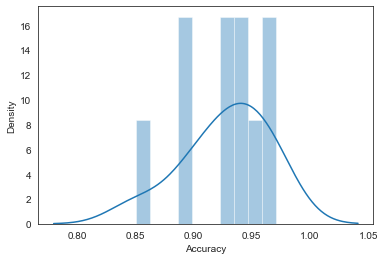

92.0 confidence interval 86.7% and 97.0%


In [319]:
sns.distplot(CVS_results,kde=True,bins=10)
plt.xlabel("Accuracy")
plt.show()
# confidence intervals
alpha = 0.92                            # for 92% confidence 
p = ((1.0-alpha)/2.0) * 100              # tail regions on right and left .25 on each side indicated by P value (border)
lower = max(0.0, np.percentile(CVS_results, p))  
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(CVS_results, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

In [320]:
# Test Accuracy with Hypertuned parameter

prediction_tuned=gs_tuned.predict(Proj_test_data)

prediction_tuned_train=gs_tuned.predict(Proj_train_data)

print("Accuracy:",metrics.accuracy_score(prediction_tuned,y_test))
print("Accuracy:",metrics.accuracy_score(prediction_tuned_train,y_train))

Accuracy: 0.9058823529411765
Accuracy: 0.9541420118343196


In [321]:
#evaluation(Confusion Metrix)
print("Confusion Matrix:\n",metrics.confusion_matrix(y_test,prediction_tuned))

Confusion Matrix:
 [[41  2  1]
 [ 1 81  7]
 [ 0  5 32]]


In [343]:
#evaluation(Confusion Metrix)
print("Classification Report:\n",metrics.classification_report(y_test,prediction_tuned))

Classification Report:
               precision    recall  f1-score   support

         bus       0.98      0.93      0.95        44
         car       0.92      0.91      0.92        89
         van       0.80      0.86      0.83        37

    accuracy                           0.91       170
   macro avg       0.90      0.90      0.90       170
weighted avg       0.91      0.91      0.91       170



 <font color=darkblue>

# Observation:

 - From the Hyper tuned parameters of PCA components, below are the accuracy.
     - Train Accuracy -95.4%
     - Test Accuracy  -90.58%
 - The Model has correctly predicted the bus with 98% precision.
 - 92% cars are predicted correctly.
 - 80% vans are predicted correctly.

<font color=darkblue>

# 6.Conclusion: Showcase key pointer on how dimensional reduction helped in this case.

  <font color=darkblue>
  
  - From the original attributes We are seeing the SVC has produced the Overfit model with the Training accuracy as 97% and Testing Accuracy as 93.5%
      - Before PCA most of the images are looks to be Car with Precision of about 98%
  
  - Latter on seeing Strong colinearity between lot of attributes We have applied PCA.
  - As a result of PCA the train and Test accuracy are looks to be a fit one.
     - After PCA none of the images looks to be biased, the system can predict the correct vehicle with Bus as 91% prediction rate, Car as 0.81% Prediction and Van as 0.92%
     - When applying Kernel RBF, the predict rate for Bus is 0.93 %, Car as 0.91% and Van as 0.86%.         

 <font color=darkblue>

# PART 2

CONTEXT: Company X is a sports management company for international cricket.

DATA DESCRIPTION: The data is collected belongs to batsman from IPL series conducted so far. Attribute Information:
1. Runs: Runs score by the batsman
2. Ave: Average runs scored by the batsman per match
3. SR: strike rate of the batsman
4. Fours: number of boundary/four scored
5. Six: number of boundary/six scored
6. HF: number of half centuries scored so far

In [92]:
batsmen_df = pd.read_csv("C:\\Users\\Sasikumar Bala\\JupyterWorkspace\\UnsupervisedLearning\\Assignment\\Project-2\\batting_bowling_ipl_bat.csv",skipinitialspace=True,skip_blank_lines = True)

In [93]:

batsmen_df.sample(10)

,Name,Runs,Ave,SR,Fours,Sixes,HF
72,NaN,nan,nan,nan,nan,nan,nan
21,DA Warner,256.0000000,36.5700000,164.1000000,28.0000000,14.0000000,3.0000000
135,PP Chawla,106.0000000,13.2500000,120.4500000,9.0000000,4.0000000,0.0000000
1,CH Gayle,733.0000000,61.0800000,160.7400000,46.0000000,59.0000000,9.0000000
8,NaN,nan,nan,nan,nan,nan,nan
149,P Kumar,35.0000000,11.6600000,116.6600000,2.0000000,1.0000000,0.0000000
88,NaN,nan,nan,nan,nan,nan,nan
93,MK Tiwary,260.0000000,26.0000000,105.6900000,21.0000000,3.0000000,1.0000000
29,DJ Bravo,371.0000000,46.3700000,140.5300000,20.0000000,20.0000000,0.0000000
23,SR Watson,255.0000000,42.5000000,151.7800000,26.0000000,14.0000000,2.0000000


In [94]:
# We are seeing lot of blank rows.

batsmen_df.shape

(180, 7)

In [95]:
batsmen_df.isnull().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [96]:
# Above shows among the 180 rows 90 rows Should be drop due to empty rows.

batsmen_df.dropna(axis=0,
    how='any',
    inplace=True)



In [97]:
# To check Index and we can see index are not reset
batsmen_df.head(10)

,Name,Runs,Ave,SR,Fours,Sixes,HF
1,CH Gayle,733.0000000,61.0800000,160.7400000,46.0000000,59.0000000,9.0000000
3,G Gambhir,590.0000000,36.8700000,143.5500000,64.0000000,17.0000000,6.0000000
5,V Sehwag,495.0000000,33.0000000,161.2300000,57.0000000,19.0000000,5.0000000
7,CL White,479.0000000,43.5400000,149.6800000,41.0000000,20.0000000,5.0000000
9,S Dhawan,569.0000000,40.6400000,129.6100000,58.0000000,18.0000000,5.0000000
11,AM Rahane,560.0000000,40.0000000,129.3300000,73.0000000,10.0000000,5.0000000
13,KP Pietersen,305.0000000,61.0000000,147.3400000,22.0000000,20.0000000,3.0000000
15,RG Sharma,433.0000000,30.9200000,126.6000000,39.0000000,18.0000000,5.0000000
17,AB de Villiers,319.0000000,39.8700000,161.1100000,26.0000000,15.0000000,3.0000000
19,JP Duminy,244.0000000,81.3300000,128.4200000,13.0000000,11.0000000,2.0000000


In [98]:
batsmen_df.reset_index(drop=True, inplace=True)

In [99]:
batsmen_df

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,CH Gayle,733.0000000,61.0800000,160.7400000,46.0000000,59.0000000,9.0000000
1,G Gambhir,590.0000000,36.8700000,143.5500000,64.0000000,17.0000000,6.0000000
2,V Sehwag,495.0000000,33.0000000,161.2300000,57.0000000,19.0000000,5.0000000
3,CL White,479.0000000,43.5400000,149.6800000,41.0000000,20.0000000,5.0000000
4,S Dhawan,569.0000000,40.6400000,129.6100000,58.0000000,18.0000000,5.0000000
5,AM Rahane,560.0000000,40.0000000,129.3300000,73.0000000,10.0000000,5.0000000
6,KP Pietersen,305.0000000,61.0000000,147.3400000,22.0000000,20.0000000,3.0000000
7,RG Sharma,433.0000000,30.9200000,126.6000000,39.0000000,18.0000000,5.0000000
8,AB de Villiers,319.0000000,39.8700000,161.1100000,26.0000000,15.0000000,3.0000000
9,JP Duminy,244.0000000,81.3300000,128.4200000,13.0000000,11.0000000,2.0000000


In [101]:
batsmen_df.sample(10)

,Name,Runs,Ave,SR,Fours,Sixes,HF
88,RP Singh,6.0000000,3.0000000,50.0000000,0.0000000,0.0000000,0.0000000
34,MS Bisla,213.0000000,30.4200000,133.1200000,16.0000000,10.0000000,1.0000000
24,RV Uthappa,405.0000000,27.0000000,118.0700000,38.0000000,10.0000000,2.0000000
49,M Manhas,120.0000000,30.0000000,125.0000000,10.0000000,4.0000000,0.0000000
29,MA Agarwal,225.0000000,20.4500000,142.4000000,19.0000000,15.0000000,1.0000000
26,KA Pollard,220.0000000,24.4400000,138.3600000,15.0000000,14.0000000,2.0000000
32,JH Kallis,409.0000000,25.5600000,106.5100000,34.0000000,10.0000000,2.0000000
89,R Sharma,2.0000000,0.5000000,18.1800000,0.0000000,0.0000000,0.0000000
77,DL Vettori,31.0000000,7.7500000,119.2300000,3.0000000,1.0000000,0.0000000
73,R Vinay Kumar,68.0000000,13.6000000,109.6700000,3.0000000,2.0000000,0.0000000


In [102]:
batsmen_df.shape

(90, 7)

In [103]:
batsmen_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 5.0+ KB


In [104]:
# Above you can see the shape of the Dataset has been reduced to 90 rows.
# Apart from the name attribute all others are float64.

In [105]:
# double check on the null values
batsmen_df.isnull().sum()

Name     0
Runs     0
Ave      0
SR       0
Fours    0
Sixes    0
HF       0
dtype: int64

In [106]:
batsmen_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Runs,90.0000000,219.9333333,156.2536687,2.0000000,98.0000000,196.5000000,330.7500000,733.0000000
Ave,90.0000000,24.7298889,13.6192147,0.5000000,14.6650000,24.4400000,32.1950000,81.3300000
SR,90.0000000,119.1641111,23.6565465,18.1800000,108.7450000,120.1350000,131.9975000,164.1000000
Fours,90.0000000,19.7888889,16.3998455,0.0000000,6.2500000,16.0000000,28.0000000,73.0000000
Sixes,90.0000000,7.5777778,8.0013732,0.0000000,3.0000000,6.0000000,10.0000000,59.0000000
HF,90.0000000,1.1888889,1.6886564,0.0000000,0.0000000,0.5000000,2.0000000,9.0000000


In [107]:
# Prints the value below which 25% of the data lies

print("Data_quantile(25%):\n",batsmen_df.quantile(q=0.25))

Data_quantile(25%):
 Runs     98.0000000
Ave      14.6650000
SR      108.7450000
Fours     6.2500000
Sixes     3.0000000
HF        0.0000000
Name: 0.25, dtype: float64


In [108]:
# Prints the value below which 50% of the data lies

print("Data_quantile(50%):\n",batsmen_df.quantile(q=0.50))

Data_quantile(50%):
 Runs    196.5000000
Ave      24.4400000
SR      120.1350000
Fours    16.0000000
Sixes     6.0000000
HF        0.5000000
Name: 0.5, dtype: float64


In [109]:
# Prints the value below which 75% of the data lies

print("Data_quantile(75%):\n",batsmen_df.quantile(q=0.75))

Data_quantile(75%):
 Runs    330.7500000
Ave      32.1950000
SR      131.9975000
Fours    28.0000000
Sixes    10.0000000
HF        2.0000000
Name: 0.75, dtype: float64


 <font color=darkblue>
    
# Observations:
  - From the above observations, We are clear that the 25% run scored from the dataset are by the bowlers/tail Enders.
  - 50% runs scored by the middle order Batsmen.
  - 75% runs are scored by the top order batsmen
  - More half centuries are scored by the top order batsmens.
  - Strike Rate is more for the top order batsmen which means they are the hitters.

<font color=darkblue>

# 1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.

In [110]:
#Univariate Analysis
# Measure of Skewness of Batsmen Runs:

runs_mode =batsmen_df['Runs'].mode()
runs_median = batsmen_df['Runs'].median()
runs_mean = batsmen_df['Runs'].mean()
print('Mode :',runs_mode)
print('Median :',runs_median)
print('Mean:',runs_mean)
print ('Skewness on Runs :',batsmen_df.skew()['Runs'])

if(runs_mean > runs_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0    35.0000000
1   220.0000000
dtype: float64
Median : 196.5
Mean: 219.93333333333334
Skewness on Runs : 0.7546182074017156
Then the distribution is positively skewed.


In [111]:
IQR_Runs = batsmen_df["Runs"].quantile(0.75) - batsmen_df["Runs"].quantile(0.25)

print('IQR_Runs -',IQR_Runs)

high_Wiskers_outlier = batsmen_df["Runs"].quantile(0.75) + 1.5*IQR_Runs
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = batsmen_df["Runs"].quantile(0.25)  - 1.5*IQR_Runs
print('Lower outliers <',low_Wiskers_outlier)

IQR_Runs - 232.75
Higher outliers > 679.875
Lower outliers < -251.125


Text(0.5, 1.0, 'Box Plot')

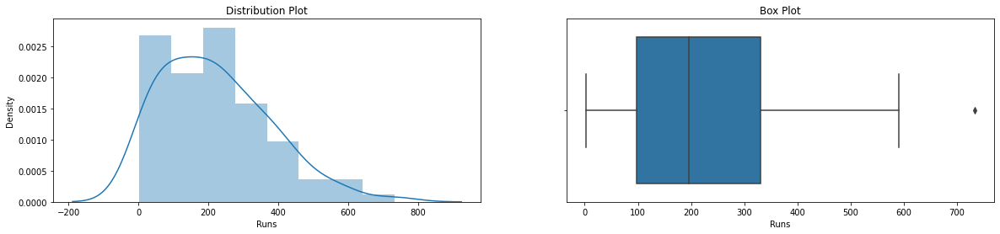

In [112]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(batsmen_df['Runs'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(batsmen_df['Runs'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
 - Runs is positively Skewed
 - There are few outliers, but no need of outlier treatments as Run is one of the important param to measure the player rankings.

In [113]:
#Univariate Analysis
# Measure of Skewness of Batsmen Ave:

ave_mode =batsmen_df['Ave'].mode()
ave_median = batsmen_df['Ave'].median()
ave_mean = batsmen_df['Ave'].mean()
print('Mode :',ave_mode)
print('Median :',ave_median)
print('Mean:',ave_mean)
print ('Skewness on Ave :',batsmen_df.skew()['Ave'])

if(ave_mean > ave_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0    6.0000000
1   11.6600000
2   24.4400000
3   27.0000000
4   28.0000000
5   33.0000000
dtype: float64
Median : 24.44
Mean: 24.729888888888883
Skewness on Ave : 1.0380761028118908
Then the distribution is positively skewed.


In [114]:
IQR_Ave = batsmen_df["Ave"].quantile(0.75) - batsmen_df["Ave"].quantile(0.25)

print('IQR_Ave -',IQR_Ave)

high_Wiskers_outlier = batsmen_df["Ave"].quantile(0.75) + 1.5*IQR_Ave
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = batsmen_df["Ave"].quantile(0.25)  - 1.5*IQR_Ave
print('Lower outliers <',low_Wiskers_outlier)

IQR_Ave - 17.53
Higher outliers > 58.49
Lower outliers < -11.630000000000003


Text(0.5, 1.0, 'Box Plot')

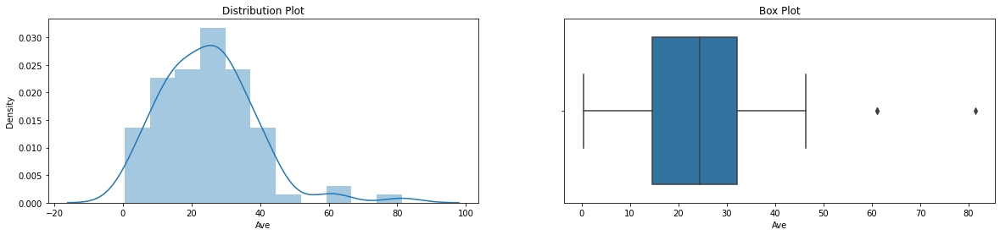

In [115]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(batsmen_df['Ave'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(batsmen_df['Ave'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
 - Avge is positively Skewed
 - There are few outliers, but no need of outlier treatments as Average is one of the important param to measure the player rankings.

In [116]:
#Univariate Analysis
# Measure of Skewness of Batsmen SR:

sr_mode =batsmen_df['SR'].mode()
sr_median = batsmen_df['SR'].median()
sr_mean = batsmen_df['SR'].mean()
print('Mode :',sr_mode)
print('Median :',sr_median)
print('Mean:',sr_mean)
print ('Skewness on SR :',batsmen_df.skew()['SR'])

if(sr_mean > sr_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0   120.0000000
1   125.0000000
dtype: float64
Median : 120.13499999999999
Mean: 119.16411111111107
Skewness on SR : -1.1661754253831866
Then the distribution is negatively skewed.


In [117]:
IQR_SR = batsmen_df["SR"].quantile(0.75) - batsmen_df["SR"].quantile(0.25)

print('IQR_SR -',IQR_SR)

high_Wiskers_outlier = batsmen_df["SR"].quantile(0.75) + 1.5*IQR_SR
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = batsmen_df["SR"].quantile(0.25)  - 1.5*IQR_SR
print('Lower outliers <',low_Wiskers_outlier)

IQR_SR - 23.252499999999998
Higher outliers > 166.87625
Lower outliers < 73.86625000000001


Text(0.5, 1.0, 'Box Plot')

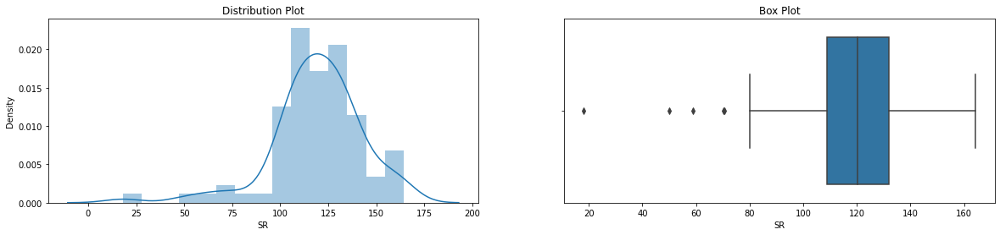

In [118]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(batsmen_df['SR'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(batsmen_df['SR'],ax=ax2)
ax2.set_title("Box Plot")

<font color=darkblue>
    
# Observations:
 - Strike Rate is Negatively Skewed
 - There are few outliers, but no need of outlier treatments as Strike Rate is one of the important param to measure the player rankings.

In [119]:
#Univariate Analysis
# Measure of Skewness of Batsmen Fours:

Fours_mode =batsmen_df['Fours'].mode()
Fours_median = batsmen_df['Fours'].median()
Fours_mean = batsmen_df['Fours'].mean()
print('Mode :',Fours_mode)
print('Median :',Fours_median)
print('Mean:',Fours_mean)
print ('Skewness on Fours :',batsmen_df.skew()['Fours'])

if(Fours_mean > Fours_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0   4.0000000
dtype: float64
Median : 16.0
Mean: 19.788888888888888
Skewness on Fours : 1.1071923631374405
Then the distribution is positively skewed.


In [120]:
IQR_Fours = batsmen_df["Fours"].quantile(0.75) - batsmen_df["Fours"].quantile(0.25)

print('IQR_Fours -',IQR_Fours)

high_Wiskers_outlier = batsmen_df["Fours"].quantile(0.75) + 1.5*IQR_Fours
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = batsmen_df["Fours"].quantile(0.25)  - 1.5*IQR_Fours
print('Lower outliers <',low_Wiskers_outlier)

IQR_Fours - 21.75
Higher outliers > 60.625
Lower outliers < -26.375


Text(0.5, 1.0, 'Box Plot')

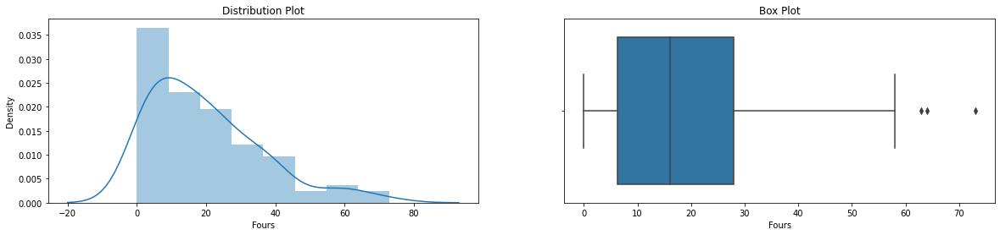

In [121]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(batsmen_df['Fours'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(batsmen_df['Fours'],ax=ax2)
ax2.set_title("Box Plot")

In [122]:
findOutlier(batsmen_df['Fours'])

25th Quantile value:  6.25
Outlier low Count = 0
List of Low outliers: 

Series([], Name: Fours, dtype: float64)
75th Quantile value:  28.0
Outlier High Count =  3
List of High outliers: 

1    64.0000000
5    73.0000000
19   63.0000000
Name: Fours, dtype: float64


In [124]:
batsmen_df.loc[[1,5,19]]

,Name,Runs,Ave,SR,Fours,Sixes,HF
1,G Gambhir,590.0000000,36.8700000,143.5500000,64.0000000,17.0000000,6.0000000
5,AM Rahane,560.0000000,40.0000000,129.3300000,73.0000000,10.0000000,5.0000000
19,R Dravid,462.0000000,28.8700000,112.1300000,63.0000000,4.0000000,2.0000000


<font color=darkblue>
    
# Observations:
 - Fours is positively Skewed
 - There are few outliers, but no need of outlier treatments as N.O of Fours is one of the important param to measure the player rankings.
 - Top boundary hitters are AM Rahane, G Gambhir and R Dravid.

In [125]:
#Univariate Analysis
# Measure of Skewness of Batsmen Sixes:

Sixes_mode =batsmen_df['Sixes'].mode()
Sixes_median = batsmen_df['Sixes'].median()
Sixes_mean = batsmen_df['Sixes'].mean()
print('Mode :',Sixes_mode)
print('Median :',Sixes_median)
print('Mean:',Sixes_mean)
print ('Skewness on Sixes :',batsmen_df.skew()['Sixes'])

if(Sixes_mean > Sixes_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0   0.0000000
1   4.0000000
dtype: float64
Median : 6.0
Mean: 7.5777777777777775
Skewness on Sixes : 3.226594649080933
Then the distribution is positively skewed.


In [126]:
IQR_Sixes = batsmen_df["Sixes"].quantile(0.75) - batsmen_df["Sixes"].quantile(0.25)

print('IQR_Sixes -',IQR_Sixes)

high_Wiskers_outlier = batsmen_df["Sixes"].quantile(0.75) + 1.5*IQR_Sixes
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = batsmen_df["Sixes"].quantile(0.25)  - 1.5*IQR_Sixes
print('Lower outliers <',low_Wiskers_outlier)

IQR_Sixes - 7.0
Higher outliers > 20.5
Lower outliers < -7.5


Text(0.5, 1.0, 'Box Plot')

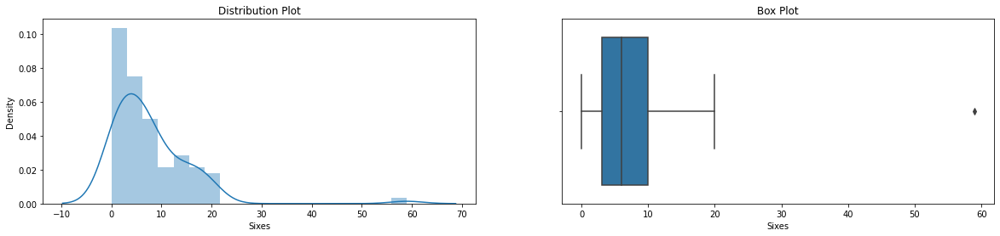

In [127]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(batsmen_df['Sixes'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(batsmen_df['Sixes'],ax=ax2)
ax2.set_title("Box Plot")

In [128]:
findOutlier(batsmen_df['Sixes'])

25th Quantile value:  3.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: Sixes, dtype: float64)
75th Quantile value:  10.0
Outlier High Count =  1
List of High outliers: 

0   59.0000000
Name: Sixes, dtype: float64


In [129]:
batsmen_df.loc[0]

Name       CH Gayle
Runs    733.0000000
Ave      61.0800000
SR      160.7400000
Fours    46.0000000
Sixes    59.0000000
HF        9.0000000
Name: 0, dtype: object

<font color=darkblue>
    
# Observations:
 - Sixes are positively Skewed
 - There are few outliers, but no need of outlier treatments as N.O of Sixes is one of the important param to measure the player rankings.
 - Top Six hitter is CH Gayle.

In [130]:
#Univariate Analysis
# Measure of Skewness of Batsmen HF:

HF_mode =batsmen_df['HF'].mode()
HF_median = batsmen_df['HF'].median()
HF_mean = batsmen_df['HF'].mean()
print('Mode :',HF_mode)
print('Median :',HF_median)
print('Mean:',HF_mean)
print ('Skewness on HF :',batsmen_df.skew()['HF'])

if(HF_mean > HF_median):
     print('Then the distribution is positively skewed.')
else:
     print('Then the distribution is negatively skewed.')

Mode : 0   0.0000000
dtype: float64
Median : 0.5
Mean: 1.1888888888888889
Skewness on HF : 2.0011991351731986
Then the distribution is positively skewed.


In [131]:
IQR_HF = batsmen_df["HF"].quantile(0.75) - batsmen_df["HF"].quantile(0.25)

print('IQR_HF -',IQR_HF)

high_Wiskers_outlier = batsmen_df["HF"].quantile(0.75) + 1.5*IQR_HF
print('Higher outliers >',high_Wiskers_outlier)

low_Wiskers_outlier = batsmen_df["HF"].quantile(0.25)  - 1.5*IQR_HF
print('Lower outliers <',low_Wiskers_outlier)

IQR_HF - 2.0
Higher outliers > 5.0
Lower outliers < -3.0


Text(0.5, 1.0, 'Box Plot')

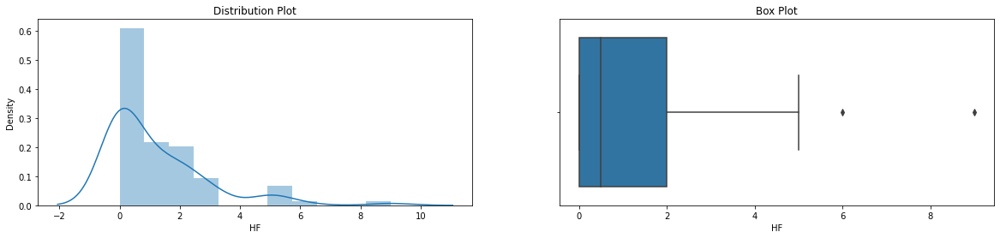

In [132]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(20,4)
sns.distplot(batsmen_df['HF'],ax=ax1)
ax1.set_title("Distribution Plot")

sns.boxplot(batsmen_df['HF'],ax=ax2)
ax2.set_title("Box Plot")

In [90]:
findOutlier(batsmen_df['HF'])

25th Quantile value:  0.0
Outlier low Count = 0
List of Low outliers: 

Series([], Name: HF, dtype: float64)
75th Quantile value:  2.0
Outlier High Count =  2
List of High outliers: 

0   9.0000000
1   6.0000000
Name: HF, dtype: float64


In [133]:
batsmen_df.loc[[0,1]]

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,CH Gayle,733.0000000,61.0800000,160.7400000,46.0000000,59.0000000,9.0000000
1,G Gambhir,590.0000000,36.8700000,143.5500000,64.0000000,17.0000000,6.0000000


<font color=darkblue>
    
# Observations:
 - HF are positively Skewed
 - There are few outliers, but no need of outlier treatments as HF is one of the important param to measure the player rankings.
 - Highest fifty is scored by CH Gayle followed by G Gambhir.

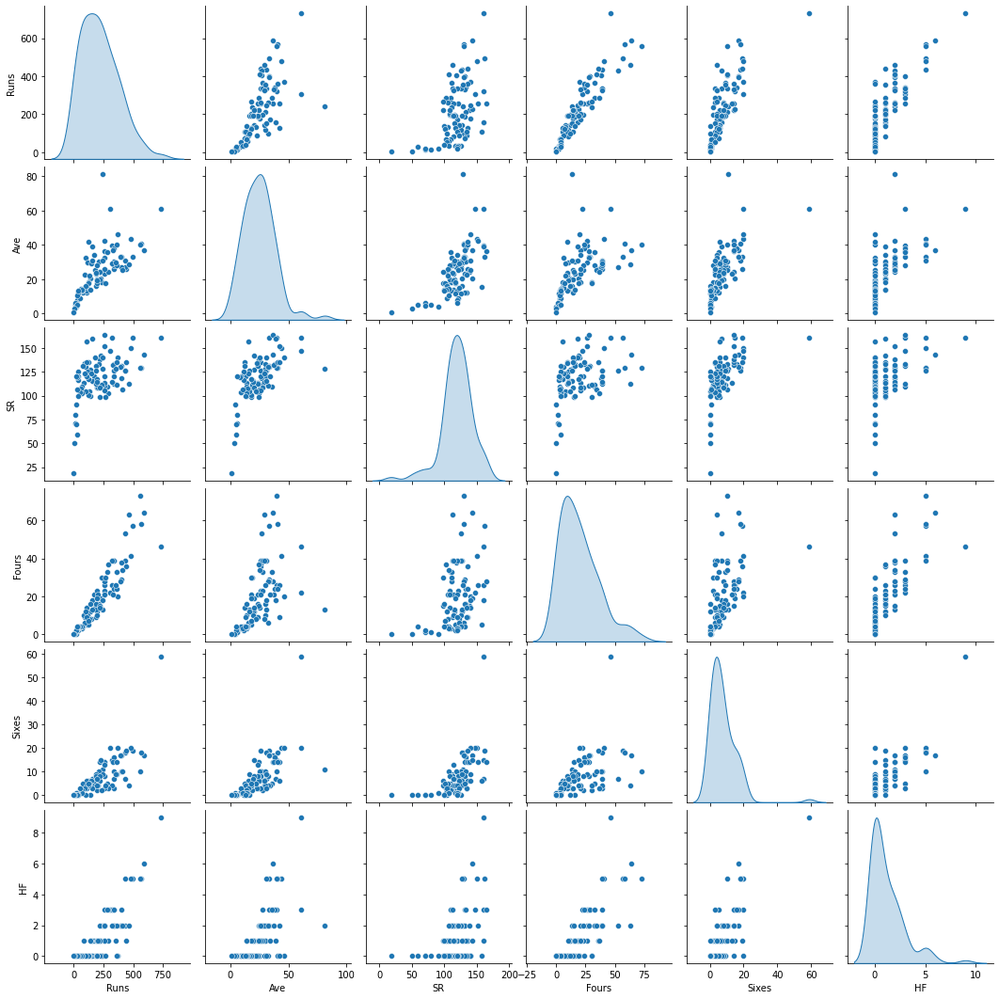

In [134]:
#Visually inspect the covariance between independent dimensions

sns.pairplot(batsmen_df,diag_kind="kde")

<font color=darkblue>
    
# Observation
  - We are seeing a strong linear correlation between multiple dimensions, few are below.
      - Runs vs Average.
      - Runs vs SR.
      - Runs vs Fours.
      - Runs vs Sixes.
      - Runs vs HF.
      - AVG vs SR.
      - AVG vs Fours.
      - AVG vs Sixes.
  - If the HF is more there is more in Runs,SR,Fours,Sixes
  - We can apply PCA as there are linear relationship among multiple dimensions.

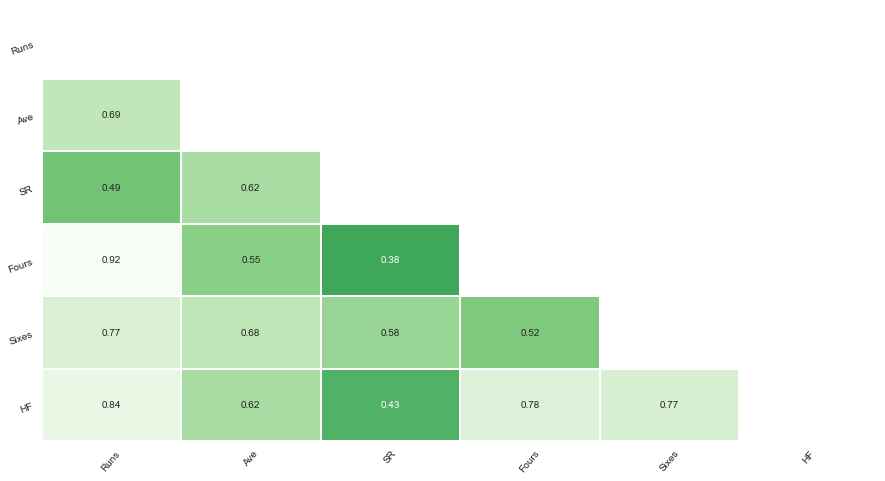

In [135]:
# Heatmap
#Correlation Matrix
corr = batsmen_df.corr() # correlation matrix
lower_triangle = np.tril(corr, k = -1)  # select only the lower triangle of the correlation matrix
mask = lower_triangle == 0  # to mask the upper triangle in the following heatmap

plt.figure(figsize = (15,8))  # setting the figure size
sns.set_style(style = 'white')  # Setting it to white so that we do not see the grid lines
sns.heatmap(lower_triangle, center=0.5, cmap= 'Greens_r', annot= True, xticklabels = corr.index, yticklabels = corr.columns,
            cbar= False, linewidths= 1, mask = mask)   # Da Heatmap
plt.xticks(rotation = 50)   # Aesthetic purposes
plt.yticks(rotation = 20)   # Aesthetic purposes
plt.show()

<font color=darkblue>
    
# Observation
  - From the correlation matrix we can see there is no negative correlation.
  - postive correlation is more for HF vs Runs, HF vs Fours, HF vs Sixes,HF vs Ave. HF is a prime feature to consider.
  - Next important feature looks like Sixes vs runs,sixes vs Ave, Sixes vs SR,Sixes vs Fours.
  - Next important feature looks to be Fours vs Runs, Fours vs Ave.
  - Next is SR vs AVE.
  - Many features show high correlation indicating that we need to drop multiple features- we will use PCA for the same

<font color=darkblue>

# 2.Build a data driven model to rank all the players in the dataset using all or the most important performance features.

In [136]:
# Getting the Category Variable

y = batsmen_df["Name"]

# Separsting the Multiple Dimension on whihc PCA is going to be applied.

X = batsmen_df[batsmen_df.columns[1:]]

In [137]:
y

0            CH Gayle
1           G Gambhir
2            V Sehwag
3            CL White
4            S Dhawan
5           AM Rahane
6        KP Pietersen
7           RG Sharma
8      AB de Villiers
9           JP Duminy
10          DA Warner
11          SR Watson
12       F du Plessis
13            OA Shah
14           DJ Bravo
15          DJ Hussey
16           SK Raina
17          AT Rayudu
18      Mandeep Singh
19           R Dravid
20           DR Smith
21            M Vijay
22          SPD Smith
23         TM Dilshan
24         RV Uthappa
25           SE Marsh
26         KA Pollard
27    DMD Jayawardene
28            V Kohli
29         MA Agarwal
30       SR Tendulkar
31         MEK Hussey
32          JH Kallis
33           MS Dhoni
34           MS Bisla
35           JD Ryder
36           BJ Hodge
37            NV Ojha
38             DB Das
39       AC Gilchrist
40        BB McCullum
41          IK Pathan
42      Azhar Mahmood
43          MK Pandey
44        S Badrinath
45        

In [138]:
X.head(10)

,Runs,Ave,SR,Fours,Sixes,HF
0,733.0000000,61.0800000,160.7400000,46.0000000,59.0000000,9.0000000
1,590.0000000,36.8700000,143.5500000,64.0000000,17.0000000,6.0000000
2,495.0000000,33.0000000,161.2300000,57.0000000,19.0000000,5.0000000
3,479.0000000,43.5400000,149.6800000,41.0000000,20.0000000,5.0000000
4,569.0000000,40.6400000,129.6100000,58.0000000,18.0000000,5.0000000
5,560.0000000,40.0000000,129.3300000,73.0000000,10.0000000,5.0000000
6,305.0000000,61.0000000,147.3400000,22.0000000,20.0000000,3.0000000
7,433.0000000,30.9200000,126.6000000,39.0000000,18.0000000,5.0000000
8,319.0000000,39.8700000,161.1100000,26.0000000,15.0000000,3.0000000
9,244.0000000,81.3300000,128.4200000,13.0000000,11.0000000,2.0000000


In [139]:
# Apply PCA
# Step 1: Apply the Standarization/Zscore

sc = StandardScaler()
X_std =  sc.fit_transform(X)

In [140]:
# Step 2: Get the Covariance Matrix

cov_batsmen_matrix = np.cov(X_std.T)
print('Covariance Matrix \n%s', cov_batsmen_matrix)

Covariance Matrix 
%s [[1.01123596 0.70077082 0.49903347 0.9291323  0.77842677 0.84453142]
 [0.70077082 1.01123596 0.63061271 0.55234856 0.69008186 0.62772842]
 [0.49903347 0.63061271 1.01123596 0.38913406 0.59050396 0.43238784]
 [0.9291323  0.55234856 0.38913406 1.01123596 0.52844526 0.79249429]
 [0.77842677 0.69008186 0.59050396 0.52844526 1.01123596 0.77632221]
 [0.84453142 0.62772842 0.43238784 0.79249429 0.77632221 1.01123596]]


In [141]:
# Step 3: Eigen Values and Eigen Vectors

eig_vals, eig_vecs = np.linalg.eig(cov_batsmen_matrix)
print('Eigen Vectors \n%s', eig_vecs)
print('\n Eigen Values \n%s', eig_vals)

Eigen Vectors 
%s [[-0.4582608  -0.26643209 -0.70483594 -0.45840889  0.10977942  0.00520142]
 [-0.39797313  0.33111756  0.0606373   0.10122837 -0.00550486 -0.84736307]
 [-0.3253838   0.69780334 -0.05624934  0.11890348  0.45013448  0.43275029]
 [-0.40574167 -0.47355804  0.58514214 -0.09676885  0.50823538  0.03252305]
 [-0.41733459  0.17902455  0.35786211 -0.39458014 -0.66942589  0.24878157]
 [-0.43237178 -0.27593225 -0.16096217  0.77486668 -0.28082541  0.17811777]]

 Eigen Values 
%s [4.30252561 0.83636692 0.01706297 0.16567829 0.41665751 0.32912443]


In [142]:
print("Eigen Values:")
pd.DataFrame(eig_vals).transpose()

Eigen Values:


,0,1,2,3,4,5
0,4.3025256,0.8363669,0.0170630,0.1656783,0.4166575,0.3291244


In [143]:
tot = sum(eig_vals)
var_exp = [( i /tot ) * 100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 70.91199612  84.696562    91.56369501  96.98815324  99.71877694
 100.        ]


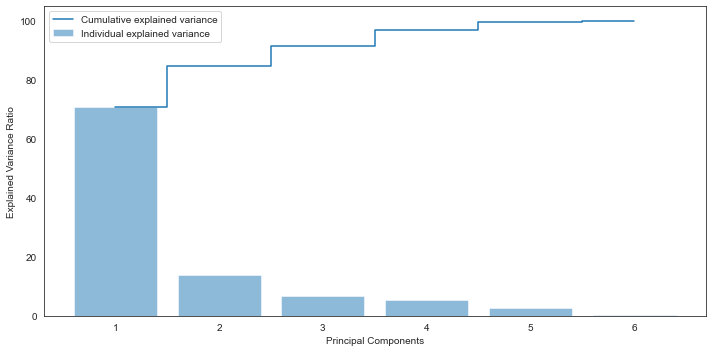

In [144]:
# Ploting 
plt.figure(figsize=(10 , 5))
plt.bar(range(1, eig_vals.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, eig_vals.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [146]:

pca = PCA(n_components=5)

X_batsmen_reduced = pd.DataFrame(pca.fit_transform(X_std))

print(X_batsmen_reduced)

            0          1          2          3          4
0   8.5167741 -0.3545748  3.6724738 -0.9962667  0.1330450
1   4.6183396  1.4767299 -0.5036304 -0.5944938 -0.6126692
2   4.1422505  0.4714381 -0.5572037 -1.1011835 -0.4342909
3   3.8994111  0.0418155  0.2621426 -0.2280845 -0.5472439
4   4.1200716  1.4010017 -0.1166434 -0.0147116 -0.1569184
5   4.0244364  2.0250819 -1.2457060  0.1709164 -0.4849890
6   2.8792808 -1.4943539  0.6945945  1.1632318 -0.3691180
7   2.9190152  0.9430183  0.6251993 -0.5250469 -0.5830178
8   2.3273886 -1.1335514 -0.1326857 -0.2642233 -0.4636974
9   2.0816424 -1.7579377  0.4640285  3.1907166 -0.6436839
10  2.0832807 -1.1690116 -0.2931895 -0.4963093 -0.6777291
11  1.7769431 -1.1726590 -0.1592406  0.2114364 -0.2131631
12  2.1251667  0.1035839  0.4612171 -0.1998456  0.0890942
13  1.9388725 -0.2873264  0.5395909  0.0969989 -0.2052848
14  1.7276362 -1.3725301  0.3329539  0.6931424  1.3418072
15  1.8171317 -0.0569579  0.3473528 -0.0816741  0.5454019
16  1.8698951 

In [147]:
vectors = pca.components_.round(4)
#Print feature effects
print("PC 1 effects=" + str(dict(zip(X.columns,vectors[0]))))
print("PC 2 effects=" + str(dict(zip(X.columns,vectors[1]))))
print("PC 3 effects=" + str(dict(zip(X.columns,vectors[2]))))
print("PC 4 effects=" + str(dict(zip(X.columns,vectors[3]))))
print("PC 5 effects=" + str(dict(zip(X.columns,vectors[4]))))

PC 1 effects={'Runs': 0.4583, 'Ave': 0.398, 'SR': 0.3254, 'Fours': 0.4057, 'Sixes': 0.4173, 'HF': 0.4324}
PC 2 effects={'Runs': 0.2664, 'Ave': -0.3311, 'SR': -0.6978, 'Fours': 0.4736, 'Sixes': -0.179, 'HF': 0.2759}
PC 3 effects={'Runs': -0.1098, 'Ave': 0.0055, 'SR': -0.4501, 'Fours': -0.5082, 'Sixes': 0.6694, 'HF': 0.2808}
PC 4 effects={'Runs': -0.0052, 'Ave': 0.8474, 'SR': -0.4328, 'Fours': -0.0325, 'Sixes': -0.2488, 'HF': -0.1781}
PC 5 effects={'Runs': 0.4584, 'Ave': -0.1012, 'SR': -0.1189, 'Fours': 0.0968, 'Sixes': 0.3946, 'HF': -0.7749}


In [148]:
batsmen_df

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,CH Gayle,733.0000000,61.0800000,160.7400000,46.0000000,59.0000000,9.0000000
1,G Gambhir,590.0000000,36.8700000,143.5500000,64.0000000,17.0000000,6.0000000
2,V Sehwag,495.0000000,33.0000000,161.2300000,57.0000000,19.0000000,5.0000000
3,CL White,479.0000000,43.5400000,149.6800000,41.0000000,20.0000000,5.0000000
4,S Dhawan,569.0000000,40.6400000,129.6100000,58.0000000,18.0000000,5.0000000
5,AM Rahane,560.0000000,40.0000000,129.3300000,73.0000000,10.0000000,5.0000000
6,KP Pietersen,305.0000000,61.0000000,147.3400000,22.0000000,20.0000000,3.0000000
7,RG Sharma,433.0000000,30.9200000,126.6000000,39.0000000,18.0000000,5.0000000
8,AB de Villiers,319.0000000,39.8700000,161.1100000,26.0000000,15.0000000,3.0000000
9,JP Duminy,244.0000000,81.3300000,128.4200000,13.0000000,11.0000000,2.0000000


In [149]:
# Using the 1st PCA component  as all the variables have positive correlation
# to rank the batsmens_df dataset without standard scalar. So that it will be easy
# for interpretation and verification.

batsmen_df['NetRate'] = 0.4583 * batsmen_df['Runs']+0.398 * batsmen_df['Ave']+0.3254*batsmen_df['SR']+ 0.4057 *batsmen_df['Fours']
+0.4173 *batsmen_df['Sixes']+0.4324*batsmen_df['HF']

0    28.5123000
1     9.6885000
2    10.0907000
3    10.5080000
4     9.6734000
5     6.3350000
6     9.6432000
7     9.6734000
8     7.5567000
9     5.4551000
10    7.1394000
11    6.7070000
12    8.3913000
13    7.9740000
14    8.3460000
15    7.9589000
16    8.3611000
17    6.7070000
18    3.7859000
19    2.5340000
20    3.3535000
21    5.0378000
22    5.8422000
23    3.3837000
24    5.0378000
25    3.7859000
26    6.7070000
27    2.5491000
28    4.6205000
29    6.6919000
30    2.5340000
31    4.2032000
32    5.0378000
33    4.1881000
34    4.6054000
35    4.2032000
36    3.7557000
37    5.8573000
38    2.5038000
39    2.1016000
40    1.6843000
41    2.5038000
42    3.3384000
43    2.9362000
44    1.2670000
45    1.6692000
46    1.6843000
47    2.5038000
48    3.3535000
49    1.6692000
50    2.5038000
51    3.7557000
52    2.9362000
53    2.1016000
54    1.2519000
55    1.2519000
56    3.3384000
57    0.8346000
58    3.3384000
59    1.6692000
60    1.6692000
61    2.9211000
62    1.

In [150]:
batsmen_df['Ranking'] = batsmen_df['NetRate'].rank(method='max',ascending=False)

In [151]:
batsmen_df.sort_values(by=['Ranking'])

,Name,Runs,Ave,SR,Fours,Sixes,HF,NetRate,Ranking
0,CH Gayle,733.0000000,61.0800000,160.7400000,46.0000000,59.0000000,9.0000000,431.2107360,1.0000000
1,G Gambhir,590.0000000,36.8700000,143.5500000,64.0000000,17.0000000,6.0000000,357.7472300,2.0000000
5,AM Rahane,560.0000000,40.0000000,129.3300000,73.0000000,10.0000000,5.0000000,344.2680820,3.0000000
4,S Dhawan,569.0000000,40.6400000,129.6100000,58.0000000,18.0000000,5.0000000,342.6531140,4.0000000
2,V Sehwag,495.0000000,33.0000000,161.2300000,57.0000000,19.0000000,5.0000000,315.5816420,5.0000000
3,CL White,479.0000000,43.5400000,149.6800000,41.0000000,20.0000000,5.0000000,302.1941920,6.0000000
19,R Dravid,462.0000000,28.8700000,112.1300000,63.0000000,4.0000000,2.0000000,285.2710620,7.0000000
18,Mandeep Singh,432.0000000,27.0000000,126.3100000,53.0000000,7.0000000,2.0000000,271.3349740,8.0000000
16,SK Raina,441.0000000,25.9400000,135.6900000,36.0000000,19.0000000,1.0000000,271.1931460,9.0000000
7,RG Sharma,433.0000000,30.9200000,126.6000000,39.0000000,18.0000000,5.0000000,267.7680000,10.0000000


<font color=darkblue>
    
# Observation
  - After using the PCA technique to calculate the ranking, We have found the Rank 1 batsmen as CH Gayle with 
    Net Rate value as 431.21 and the last Rank batsmen as R Sharma with the Net Rate value as 7.03

<font color=darkblue>

# Part 3

<font color=darkblue>

# 1. List down all possible dimensionality reduction techniques that can be implemented using python.

<font color=darkblue>

- Missing Value Ratio: 
	- If the dataset has too many missing values, we use this approach to reduce the number of variables. We can drop the variables having a large number of missing values in them
- Low Variance filter: 
	- We apply this approach to identify and drop constant variables from the dataset. The target variable is not unduly affected by variables with low variance, and hence these variables can be safely dropped
- High Correlation filter: 
	- A pair of variables having high correlation increases multicollinearity in the dataset. So, we can use this technique to find highly correlated features and drop them accordingly
- Random Forest: 
	- This is one of the most commonly used techniques which tells us the importance of each feature present in the dataset. We can find the importance of each feature and keep the top most features, resulting in dimensionality reduction
- Both Backward Feature Elimination and Forward Feature Selection techniques take a lot of computational time and are thus generally used on smaller datasets
- Factor Analysis: 
	- This technique is best suited for situations where we have highly correlated set of variables. It divides the variables based on their correlation into different groups, and represents each group with a factor
- Principal Component Analysis: 
	- This is one of the most widely used techniques for dealing with linear data. It divides the data into a set of components which try to explain as much variance as possible
    
- Independent Component Analysis: We can use ICA to transform the data into independent components which describe the data using less number of components
    
- ISOMAP: We use this technique when the data is strongly non-linear
    
- t-SNE: This technique also works well when the data is strongly non-linear. It works extremely well for visualizations as well
    
- UMAP: This technique works well for high dimensional data. Its run-time is shorter as compared to t-SNE

<font color=darkblue>

# 2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python.

(613, 960, 3)


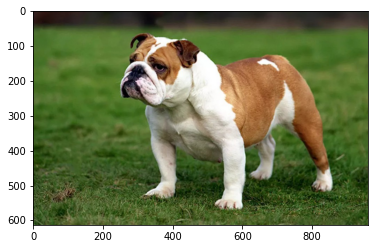

In [3]:
## Importing libraries.

import matplotlib.image as mplib 
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

img = mplib.imread('C:\\Users\\Sasikumar Bala\\JupyterWorkspace\\UnsupervisedLearning\\Assignment\\Project-2\\BullDog.jpg')
print(img.shape)
plt.imshow(img)

In [6]:
# Reshaping the image to 2-dimensional so we are multiplying columns with depth so 960 X 3 = 2880.

img_r = np.reshape(img, (613, 2880)) 

print(img_r.shape) 

(613, 2880)


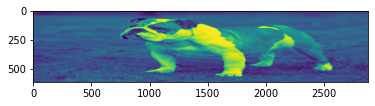

In [7]:
# After Multiplying the Depth  3 with the column 960
plt.imshow(img_r)

img_transformed Shape -  (613, 32)
0.9601990136455073
temp shape  (613, 2880)


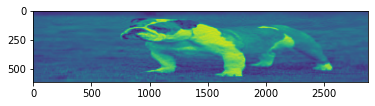

In [13]:
pca = PCA(32).fit(img_r) 
img_transformed = pca.transform(img_r) 
print("img_transformed Shape - ",img_transformed.shape)
print(np.sum(pca.explained_variance_ratio_) )

#Retrieving the results of the image after Dimension reduction.

temp = pca.inverse_transform(img_transformed) 
print("temp shape ",temp.shape)

plt.imshow(temp)

(613, 960, 3)


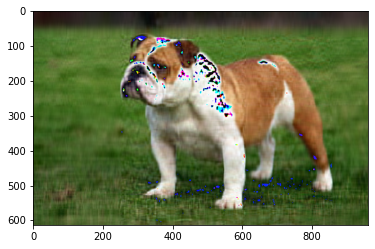

In [24]:
temp = np.reshape(temp, (613,960,3)) 
print(temp.shape) 
plt.imshow(temp.astype('uint8'))

<font color=darkblue>
    
# Observations:
   - Yes we can do PCA on the Multimedia Data set above is one of image with initial dimensions as (613, 960, 3) and latter on applying the PCA so that it will compress the image, the reduced dimension is shown in the output. 